In [90]:
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import glob
import os,sys
import fitsio as fio
import matplotlib as mpl
from tqdm import tqdm
import proplot as pplt
import pickle
import glob
%matplotlib inline

matplotlib.rcParams.update({'font.size': 20})

# Set a path to the metadetect and pizza-cutter files.

In [ ]:
work_mdet = '/global/project/projectdirs/des/myamamot/metadetect'
work_pizza = '/global/cscratch1/sd/myamamot/pizza-slice/griz'
f = open(os.path.join(work_mdet, 'mdet_files.txt'), 'r')
fs = f.read().split('\n')[:-1]

In [ ]:
fs[0]

In [ ]:
d_one = fio.read(os.path.join(work_mdet, fs[0]))
d_one.dtype

# Catalog Masking Example!
This includes, 
 - the use of healsparse
 - the use of the mask
 - the mapping of the mask

In [2]:
import healsparse
import healpy as hp
import skyproj
# ma1 = hp.read_map('y6a2_foreground_mask_v1.1.fits.gz', nest=True)
# y6v1_hmap = healsparse.HealSparseMap(nside_coverage=32, healpix_map=ma1)
# y6v2_hmap = healsparse.HealSparseMap.read('y6a2_foreground_mask_v1.2.hs')
hmap = healsparse.HealSparseMap.read('/global/cfs/cdirs/des/y6-shear-catalogs/y6-combined-hleda-gaiafull-des-stars-hsmap16384-nomdet-v2.fits')

In [ ]:
hmap

In [ ]:
# Boolean values for ra, dec are in the mask. 
# hmap.get_values.pos(ra, dec, valid_mask=True)

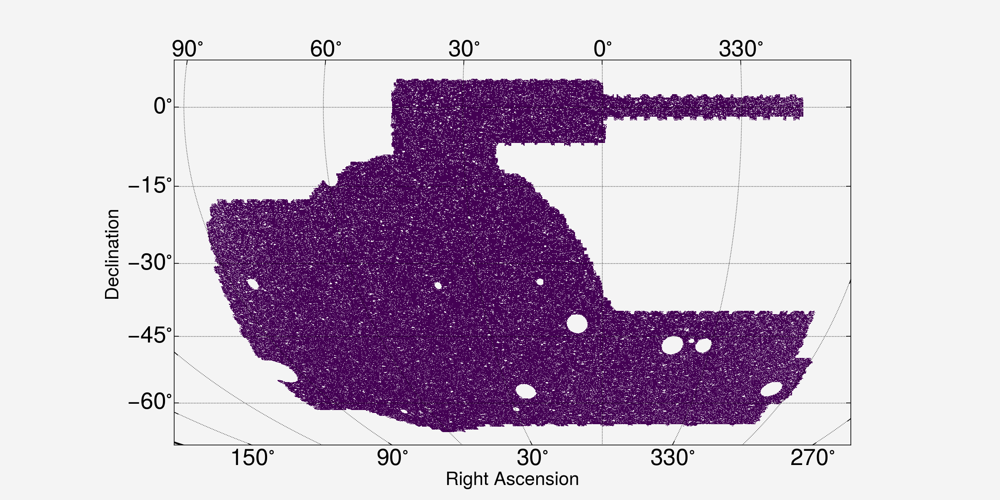

In [3]:
fig,ax = plt.subplots(figsize=(12,6))
m = skyproj.McBrydeSkyproj(ax=ax, autorescale=False)
_ = m.draw_hspmap(hmap, cmap='viridis')

In [ ]:
fig,ax = plt.subplots(figsize=(18,6), nrows=1, ncols=3, sharey=False, sharex=False)
m = skyproj.McBrydeSkyproj(ax=ax[0], autorescale=False)
_ = m.draw_hspmap(hmap, cmap='viridis')

m = skyproj.McBrydeSkyproj(ax=ax[1])
_ = m.draw_hspmap(y6v1_hmap, cmap='viridis')
plt.title('gold mask v1.1', fontsize=20)

m = skyproj.McBrydeSkyproj(ax=ax[2])
_ = m.draw_hspmap(y6v2_hmap, cmap='viridis')
plt.title('gold mask v1.2', fontsize=20)

plt.savefig('y6_mask_map_compare.pdf', bbox_inches='tight')

In [10]:
# Choose random points within the mask. 
ra_rand, dec_rand = healsparse.make_uniform_randoms_fast(hmap, 262000)
rand_pos = np.zeros(262000, dtype=[('ra', float), ('dec', float)])
d = np.stack([ra_rand, dec_rand], axis=1)
rand_pos['ra'] = d[:,0]
rand_pos['dec'] = d[:,1]
fio.write('/global/cfs/cdirs/des/y6-shear-catalogs/y6-combined-hsmap_random.fits', rand_pos)

Text(0.5, 1.0, 'random points projection map')

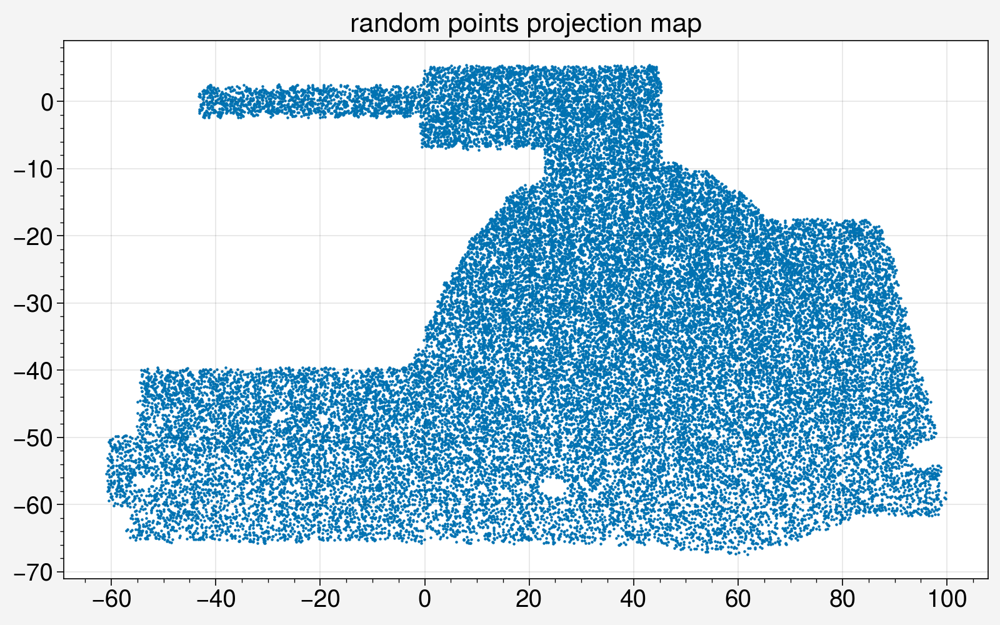

In [16]:
rd = fio.read('y6-combined-hsmap_random.fits')
fig = pplt.figure(figsize=(8,5))
ax = fig.subplots(nrows=1, ncols=1)
rd['ra'][rd['ra'] > 180] -= 360
ax.scatter(rd['ra'], rd['dec'], s=1)
ax.set_title('random points projection map')

In [ ]:
f = open('/global/project/projectdirs/des/myamamot/metadetect/mdet_files.txt', 'r')
fs = f.read().split('\n')[:-1]
mdet_filenames = [fname.split('/')[-1] for fname in fs]
tilenames = [d.split('_')[0] for d in mdet_filenames]

for fname in tqdm(mdet_filenames[0:1]):
    d = fio.read(os.path.join('/global/project/projectdirs/des/myamamot/metadetect', fname))
    mag_g = 30.0 - 2.5*np.log10(d["mdet_g_flux"])
    mag_r = 30.0 - 2.5*np.log10(d["mdet_r_flux"])
    mag_i = 30.0 - 2.5*np.log10(d["mdet_i_flux"])
    mag_z = 30.0 - 2.5*np.log10(d["mdet_z_flux"])
    gmr = mag_g - mag_r
    rmi = mag_r - mag_i
    imz = mag_i - mag_z

    msk = ((d["flags"] == 0) & (d["mask_flags"] == 0) & (d["mdet_flux_flags"] == 0) & (d["mdet_T_ratio"] > 0.5) & (d["mdet_s2n"] > 10) & (d["mfrac"] < 0.1) 
            & (d["mdet_T"] < 1.9 - 2.8*d["mdet_T_err"]) & (np.abs(gmr) < 5) & (np.abs(rmi) < 5) & (np.abs(imz) < 5) & np.isfinite(mag_g) & np.isfinite(mag_r) 
            & np.isfinite(mag_i) & np.isfinite(mag_z) & (mag_g < 26.5) & (mag_r < 26.5) & (mag_i < 26.2) & (mag_z < 25.6))
    in_footprint = hmap.get_values_pos(d["ra"], d["dec"], valid_mask=True)

    total_msk = (msk & in_footprint)
    d_msk = d[total_msk]

plt.scatter(d['ra'], d['dec'], color='b', s=0.1)
plt.scatter(d_msk['ra'], d_msk['dec'], color='r', s=0.1)
plt.xlim(0,0.4)
plt.show()

# Non-diagnostics plots

## number density map

In [9]:
import healpy as hp
import healsparse as hsp
import skyproj
d_flat = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/v2/metadetection_v2_s2n_sizer_weight.fits')

In [63]:
hp.nside2resol(4096, arcmin=True)

0.8588716029543515

In [10]:
nside_coverage = 512
nside_sparse = 1024

In [31]:
desy6_map = np.zeros(hp.nside2npix(nside_sparse))
pix = hp.ang2pix(nside_sparse, d_flat['ra'], d_flat['dec'], lonlat=True, nest=True)
unique_pix, idx, idx_rep = np.unique(pix, return_index=True, return_inverse=True)
desy6_map[unique_pix] += np.bincount(idx_rep, weights=np.ones(len(pix)))
res = desy6_map/(hp.pixelfunc.nside2pixarea(nside_sparse,degrees=True)*(60*60))
hsp_map = hsp.HealSparseMap(nside_coverage=nside_coverage, healpix_map=res)

(<matplotlib.colorbar.Colorbar at 0x1554c034b250>, <AxesHostAxes:>)

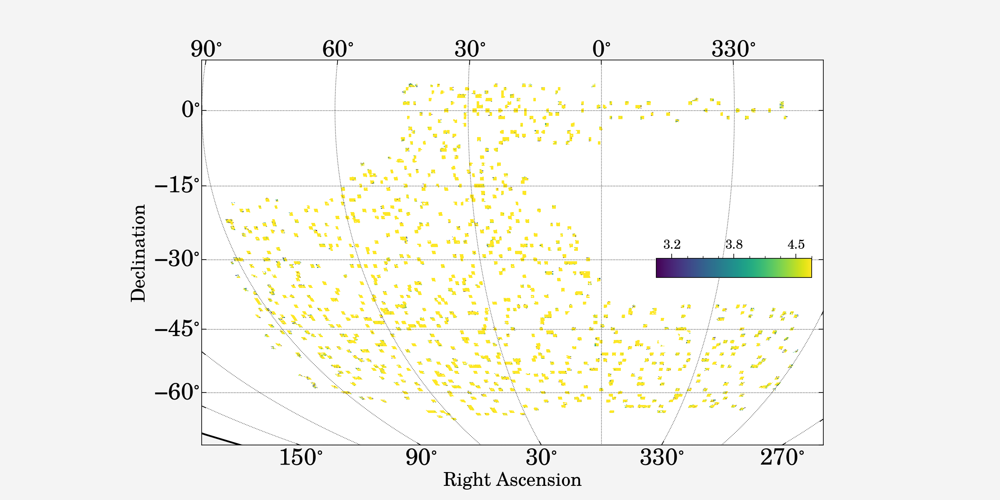

In [32]:
fig,ax = plt.subplots(figsize=(12,6))
my_cmap = matplotlib.cm.get_cmap('viridis')
my_cmap.set_under('white')
m = skyproj.DESSkyproj(ax=ax)
m.draw_des(label='DES', edgecolor='none')
_ = m.draw_hspmap(hsp_map, cmap=my_cmap, vmin=3)
m.draw_inset_colorbar()
# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v1/raw_num_density.pdf', bbox_inches='tight')

In [11]:
desy6_map_w = np.zeros(hp.nside2npix(nside_sparse))
desy6_map_w2 = np.zeros(hp.nside2npix(nside_sparse))
pix = hp.ang2pix(nside_sparse, d_flat['ra'], d_flat['dec'], lonlat=True, nest=True)

unique_pix, idx, idx_rep = np.unique(pix, return_index=True, return_inverse=True)
desy6_map_w[unique_pix] += np.bincount(idx_rep, weights=d_flat['w'])
desy6_map_w2[unique_pix] += np.bincount(idx_rep, weights=d_flat['w']**2)

res_w = desy6_map_w**2/desy6_map_w2/(hp.pixelfunc.nside2pixarea(nside_sparse,degrees=True)*(60*60))
hsp_map_w = hsp.HealSparseMap(nside_coverage=nside_coverage, healpix_map=res_w)

<ipython-input-11-625d9c933ad5>:9: RuntimeWarning: invalid value encountered in true_divide
  res_w = desy6_map_w**2/desy6_map_w2/(hp.pixelfunc.nside2pixarea(nside_sparse,degrees=True)*(60*60))


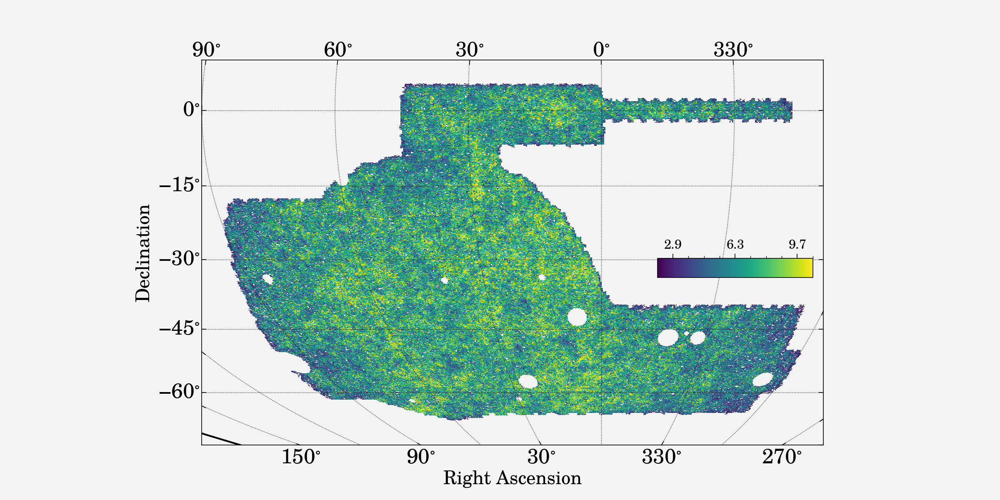

In [22]:
fig,ax = plt.subplots(figsize=(12,6))
my_cmap = matplotlib.cm.get_cmap('viridis')
my_cmap.set_under('white')
m = skyproj.DESSkyproj(ax=ax)
m.draw_des(label='DES', edgecolor='none')
_ = m.draw_hspmap(hsp_map_w, cmap=my_cmap, vmin=2)
m.draw_inset_colorbar()
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v2/weighted_num_density_s2n_sizer.pdf', bbox_inches='tight')

## selection cuts

In [3]:
from des_y6utils import mdet
mdet_fs = glob.glob('/global/cfs/cdirs/des/y6-shear-catalogs/metadetection/*_metadetect.fits')
random_files = np.random.choice(mdet_fs, 500)

l = []
for f in tqdm(random_files):
    try:
        d = fio.read(f)
    except:
        print(f)
        continue
    
    mag_g = mdet._compute_asinh_mags(d["pgauss_band_flux_g"], 0)
    mag_r = mdet._compute_asinh_mags(d["pgauss_band_flux_r"], 1)
    mag_i = mdet._compute_asinh_mags(d["pgauss_band_flux_i"], 2)
    mag_z = mdet._compute_asinh_mags(d["pgauss_band_flux_z"], 3)
    gmr = mag_g - mag_r
    rmi = mag_r - mag_i
    imz = mag_i - mag_z
    msk = ((d["wmom_s2n"] > 10)
        & (d["mfrac"] < 0.1)
        & (d['shear_bands'] == '123') 
        & (d["mdet_step"] == 'noshear')
        & (np.abs(gmr) < 5)
        & (np.abs(rmi) < 5)
        & (np.abs(imz) < 5)
        & np.isfinite(mag_g)
        & np.isfinite(mag_r)
        & np.isfinite(mag_i)
        & np.isfinite(mag_z)
        & (mag_g < 26.5)
        & (mag_r < 26.5)
        & (mag_i < 26.2)
        & (mag_z < 25.6))
    d = d[msk]
    
    res = np.zeros(len(d), dtype=[('pgauss_size', 'f8'), ('wmom_size', 'f8'), ('size_ratio', 'f8'), ('pgauss_size_error', 'f8'), ('wmom_size_error', 'f8'), ('wmom_psf_size', 'f8'), ('s2n', 'f8')])
    res['pgauss_size'] = d['pgauss_T']
    res['wmom_size'] = d['wmom_T']
    res['size_ratio'] = d['wmom_T_ratio']
    res['pgauss_size_error'] = d['pgauss_T_err']
    res['wmom_size_error'] = d['wmom_T_err']
    res['wmom_psf_size'] = d['wmom_psf_T']
    res['s2n'] = d['wmom_s2n']
    l.append(res)
res_tot = np.concatenate(l)

100%|██████████| 500/500 [38:15<00:00,  4.59s/it]


In [4]:
len(res_tot)

16776618

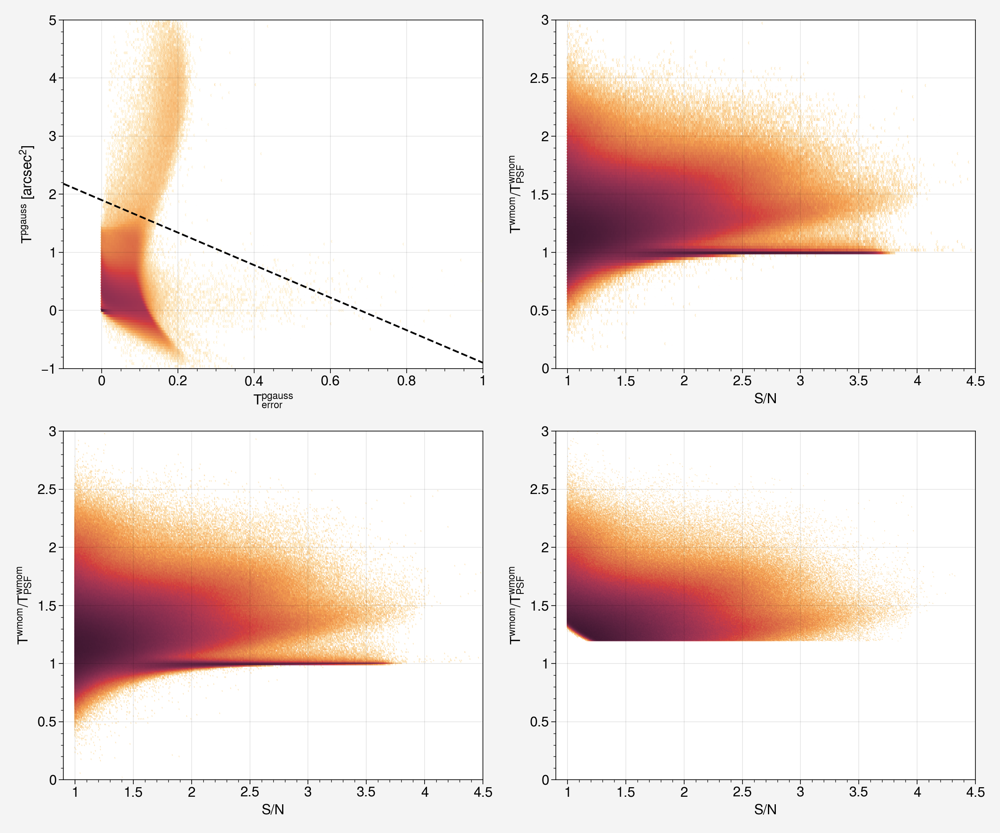

In [14]:
matplotlib.rcParams.update({'font.size': 12})
layout = np.arange(4).reshape(2, 2)
fig,ax = plt.subplot_mosaic(layout, figsize=(12,10))

x = np.linspace(-0.1, 1.0, 100)
ax[0].hexbin(res_tot['pgauss_size_error'], res_tot['pgauss_size'], bins='log', gridsize=500)
ax[0].plot(x, 1.9-2.8*x, ls='--', c='k')
ax[0].set_xlim(-0.1, 1.0)
ax[0].set_ylim(-1.0, 5)
ax[0].set_xlabel(r'$T^{pgauss}_{error}$')
ax[0].set_ylabel(r'$T^{pgauss}$ $[arcsec^2]$')


ax[1].hexbin(np.log10(res_tot['s2n']), res_tot['size_ratio'], bins='log', gridsize=500)
ax[1].set_xlim(0.9, 4.5)
ax[1].set_ylim(0, 3)
ax[1].set_xlabel('S/N')
ax[1].set_ylabel(r'$T^{wmom}/T^{wmom}_{PSF}$')

msk = ((res_tot['pgauss_size'] < 1.9-2.8*res_tot['pgauss_size_error']))
res_new = res_tot[msk]
ax[2].hexbin(np.log10(res_new['s2n']), res_new['size_ratio'], bins='log', gridsize=500)
ax[2].set_xlim(0.9, 4.5)
ax[2].set_ylim(0, 3)
ax[2].set_xlabel('S/N')
ax[2].set_ylabel(r'$T^{wmom}/T^{wmom}_{PSF}$')

msk = (res_new["size_ratio"] >= np.maximum(1.2, (1.0 + 3.0*res_new["wmom_size_error"]/res_new["wmom_psf_size"])))
res_new = res_new[msk]
ax[3].hexbin(np.log10(res_new['s2n']), res_new['size_ratio'], bins='log', gridsize=500)
ax[3].set_xlim(0.9, 4.5)
ax[3].set_ylim(0, 3)
ax[3].set_xlabel('S/N')
ax[3].set_ylabel(r'$T^{wmom}/T^{wmom}_{PSF}$')

plt.tight_layout()
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v1/size_sizeerr_cuts.png', bbox_inches='tight')

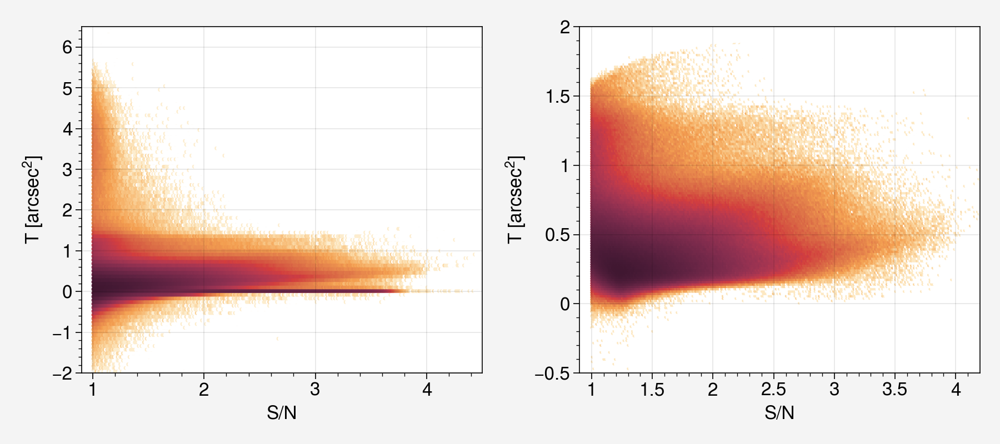

In [111]:
matplotlib.rcParams.update({'font.size': 12})
fig,ax = plt.subplots(nrows=1, ncols=2, figsize=(9,4))

ax[0].hexbin(np.log10(res_tot['s2n']), res_tot['size'], bins='log', gridsize=300)
ax[0].set_xlim(0.9, 4.5)
ax[0].set_ylim(-2, 6.5)
ax[0].set_xlabel('S/N')
ax[0].set_ylabel(r'T $[arcsec^2]$')

msk = ((res_tot['size'] < 1.9-2.8*res_tot['pgauss_size_error']) 
       & (res_tot["size_ratio"] >= np.maximum(1.2, (1.0 + 3.0*res_tot["wmom_size_error"]/res_tot["wmom_psf_size"]))))
res_new = res_tot[msk]
ax[1].hexbin(np.log10(res_new['s2n']), res_new['size'], bins='log', gridsize=300)
ax[1].set_xlim(0.9, 4.2)
ax[1].set_ylim(-0.5, 2.0)
ax[1].set_xlabel('S/N')
ax[1].set_ylabel(r'T $[arcsec^2]$')

plt.tight_layout()
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v1/size_locus_cuts.pdf', bbox_inches='tight')

# 0. Mean shear as a function of PSF and galaxy properties

In [91]:
with open('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/mean_shear_measurement_final_v3_weighted.pickle', 'rb') as f:
    d = pickle.load(f)
mdet_mom = 'gauss'
print(d.keys())

dict_keys(['psfrec_g_1', 'psfrec_g_2', 'psfrec_T', 'gauss_s2n', 'pgauss_T', 'gauss_T_ratio'])


In [96]:
def _compute_OLSfit(x, y, dy=None):
    """Find the best fitting parameters of a linear fit to the data through the
    method of ordinary least squares estimation. (i.e. find m and b for
    y = m*x + b)
    Args:
        x: Numpy array of independent variable data
        y: Numpy array of dependent variable data. Must have same size as x.
        dy: Numpy array of dependent variable standard deviations. Must be same
            size as y.
    Returns: A list with four floating point values. [m, dm, b, db]
    """
    if dy is None:
        #if no error bars, weight every point the same
        dy = np.ones(x.size)
    denom = np.sum(1 / dy**2) * np.sum((x / dy)**2) - (np.sum(x / dy**2))**2
    m = (np.sum(1 / dy**2) * np.sum(x * y / dy**2) -
         np.sum(x / dy**2) * np.sum(y / dy**2)) / denom
    b = (np.sum(x**2 / dy**2) * np.sum(y / dy**2) -
         np.sum(x / dy**2) * np.sum(x * y / dy**2)) / denom
    
    dm = np.sqrt(np.sum(1 / dy**2) / denom)
    db = np.sqrt(np.abs(np.sum(x / dy**2) / denom))
    return m, dm, b, db

def generate_annot_text(dat, xlabel, ylabel):
    
    x = np.linspace(dat[xlabel]['bin_mean'][0], dat[xlabel]['bin_mean'][-1], 50)
    m,dm,b,db = _compute_OLSfit(dat[xlabel]['bin_mean'], dat[xlabel][ylabel], dy=dat[xlabel][ylabel+'_cov'])
    reg = m*x + b
    
    text1 = "slope: "+"{:.4f}".format(m)+"+-"+"{:.4f}".format(dm)
    text2 = "offset: "+"{:.5f}".format(b)+"+-"+"{:.5f}".format(db)
        
    binnum = len(dat[xlabel]['bin_mean'])
    posx = dat[xlabel]['bin_mean'][0] #[binnum//2]
    posy = np.min(dat[xlabel][ylabel])-0.00030
    return x,reg,text1,text2,posx,posy

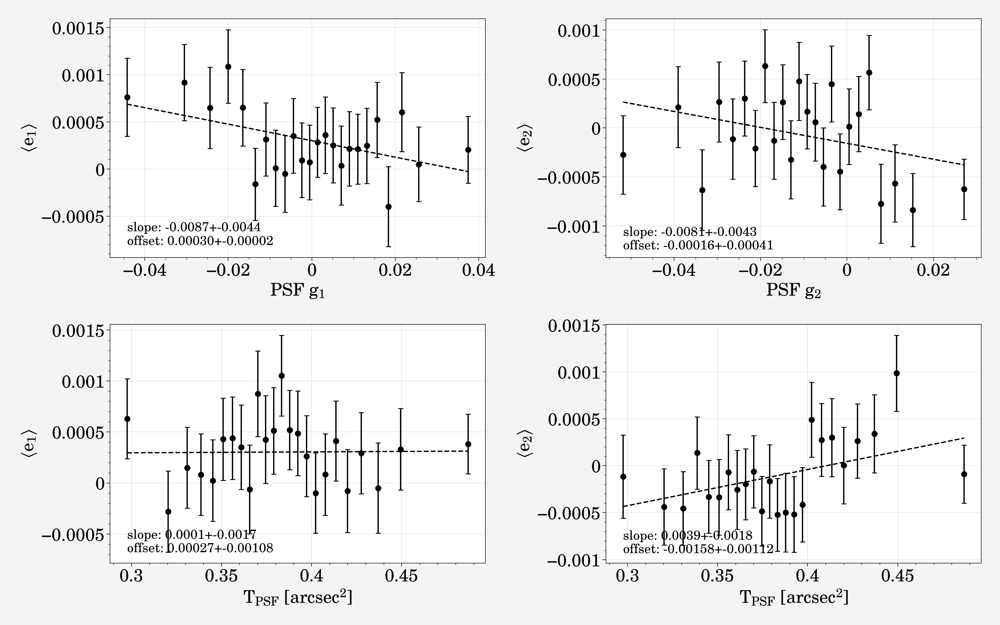

In [100]:
matplotlib.rcParams.update({'font.size': 20})
layout = np.arange(4).reshape(2, 2)
fig,ax = plt.subplot_mosaic(layout, figsize=(16,10))

ax[0].errorbar(d['psfrec_g_1']['bin_mean'], d['psfrec_g_1']['g1'], yerr=d['psfrec_g_1']['g1_cov'], fmt='o', c='k', ls='none')
x,reg,text1,text2,posx,posy = generate_annot_text(d, 'psfrec_g_1', 'g1')
ax[0].plot(x, reg, ls='--', c='k')
ax[0].text(posx, posy, text1+'\n'+text2, ha="left", va="center", size=15,)
ax[0].set_xlabel(r'PSF $g_1$')
ax[0].set_ylabel(r'$\langle e_1 \rangle$')

ax[1].errorbar(d['psfrec_g_2']['bin_mean'], d['psfrec_g_2']['g2'], yerr=d['psfrec_g_2']['g2_cov'], fmt='o', c='k', ls='none')
x,reg,text1,text2,posx,posy = generate_annot_text(d, 'psfrec_g_2', 'g2')
ax[1].plot(x, reg, ls='--', c='k')
ax[1].text(posx, posy, text1+'\n'+text2, ha="left", va="center", size=15,)
ax[1].set_xlabel(r'PSF $g_2$')
ax[1].set_ylabel(r'$\langle e_2 \rangle$')

ax[2].errorbar(d['psfrec_T']['bin_mean'], d['psfrec_T']['g1'], yerr=d['psfrec_T']['g1_cov'], fmt='o', c='k', ls='none')
x,reg,text1,text2,posx,posy = generate_annot_text(d, 'psfrec_T', 'g1')
ax[2].plot(x, reg, ls='--', c='k')
ax[2].text(posx, posy, text1+'\n'+text2, ha="left", va="center", size=15,)
ax[2].set_xlabel(r'$T_{PSF}$ [$arcsec^2$]')
ax[2].set_ylabel(r'$\langle e_1 \rangle$')

ax[3].errorbar(d['psfrec_T']['bin_mean'], d['psfrec_T']['g2'], yerr=d['psfrec_T']['g2_cov'], fmt='o', c='k', ls='none')
x,reg,text1,text2,posx,posy = generate_annot_text(d, 'psfrec_T', 'g2')
ax[3].plot(x, reg, ls='--', c='k')
ax[3].text(posx, posy, text1+'\n'+text2, ha="left", va="center", size=15,)
ax[3].set_xlabel(r'$T_{PSF}$ [$arcsec^2$]')
ax[3].set_ylabel(r'$\langle e_2 \rangle$')

plt.tight_layout()
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v3/mean_shear_stats_PSF_final_v3.pdf', bbox_inches='tight')

KeyError: 'gauss_T'

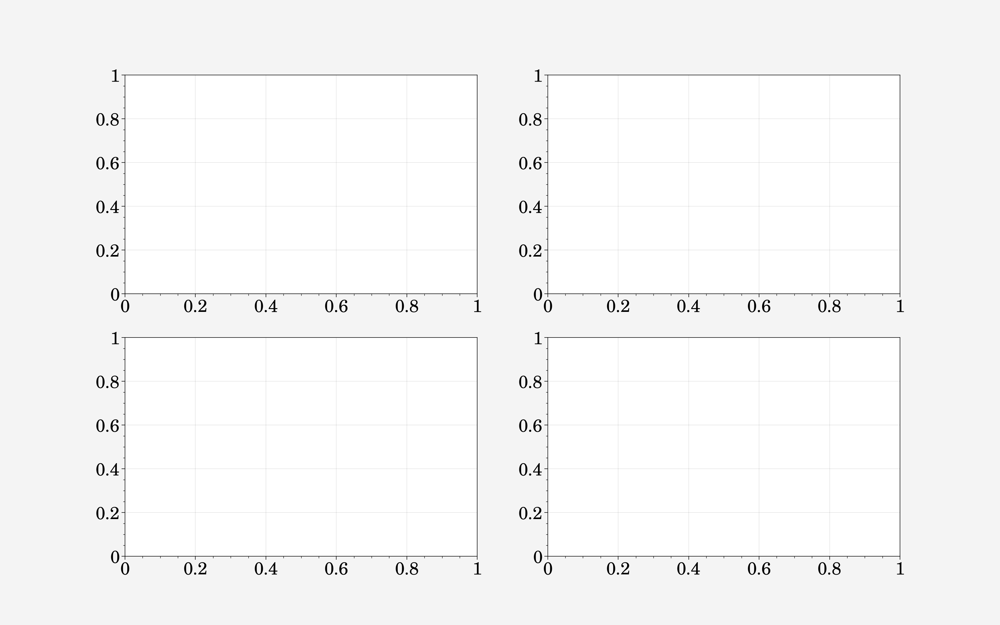

In [102]:
matplotlib.rcParams.update({'font.size': 20})
layout = np.arange(4).reshape(2, 2)
fig,ax = plt.subplot_mosaic(layout, figsize=(16,10))

ax[0].errorbar(d[mdet_mom+'_T']['bin_mean'], d[mdet_mom+'_T']['g1'], yerr=d[mdet_mom+'_T']['g1_cov'], fmt='o', c='k', ls='none')
# x,reg,text1,text2,posx,posy = generate_annot_text(d, 'pgauss_T', 'g1')
# ax[0].plot(x, reg, ls='--', c='k')
# ax[0].text(posx, posy, text1+'\n'+text2, ha="center", va="center", size=15,)
ax[0].set_xlabel(r'T [$arcsec^2$]')
ax[0].set_ylabel(r'$\langle e_1 \rangle$')

ax[1].errorbar(d[mdet_mom+'_T']['bin_mean'], d[mdet_mom+'_T']['g2'], yerr=d[mdet_mom+'_T']['g2_cov'], fmt='o', c='k', ls='none')
# x,reg,text1,text2,posx,posy = generate_annot_text(d, 'pgauss_T', 'g2')
# ax[1].plot(x, reg, ls='--', c='k')
# ax[1].text(posx, posy, text1+'\n'+text2, ha="center", va="center", size=15,)
ax[1].set_xlabel(r'T [$arcsec^2$]')
ax[1].set_ylabel(r'$\langle e_2 \rangle$')

# ax[2].errorbar(d['wmom_T_ratio']['bin_mean'], d['wmom_T_ratio']['g1'], yerr=d['wmom_T_ratio']['g1_cov'], fmt='o', c='k', ls='none')
# ax[2].set_xlabel(r'$T/T_{psf}$')
# ax[2].set_ylabel(r'$g_1$')

# ax[3].errorbar(d['wmom_T_ratio']['bin_mean'], d['wmom_T_ratio']['g2'], yerr=d['wmom_T_ratio']['g2_cov'], fmt='o', c='k', ls='none')
# ax[3].set_xlabel(r'$T/T_{psf}$')
# ax[3].set_ylabel(r'$g_2$')

ax[2].errorbar(d[mdet_mom+'_s2n']['bin_mean'], d[mdet_mom+'_s2n']['g1'], yerr=d[mdet_mom+'_s2n']['g1_cov'], fmt='o', c='k', ls='none')
ax[2].set_xscale('log')
ax[2].set_xlabel(r'$S/N$')
ax[2].set_ylabel(r'$\langle e_1 \rangle$')

ax[3].errorbar(d[mdet_mom+'_s2n']['bin_mean'], d[mdet_mom+'_s2n']['g2'], yerr=d[mdet_mom+'_s2n']['g2_cov'], fmt='o', c='k', ls='none')
ax[3].set_xscale('log')
ax[3].set_xlabel(r'$S/N$')
ax[3].set_ylabel(r'$\langle e_2 \rangle$')

plt.tight_layout()
# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v3/mean_shear_stats_GAL_final_v3.pdf', bbox_inches='tight')

# 1. Number count, RMS of shear, shear response, shear weight as a function of S/N and T_ratio

In [41]:
with open('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/inverse_variance_weight_v3.pickle', 'rb') as handle:
    res = pickle.load(handle)

<ipython-input-8-eb115f2aa844>:17: RuntimeWarning: divide by zero encountered in log10
  im = ax.pcolormesh(X, Y, np.log10(count_all), vmin=3)


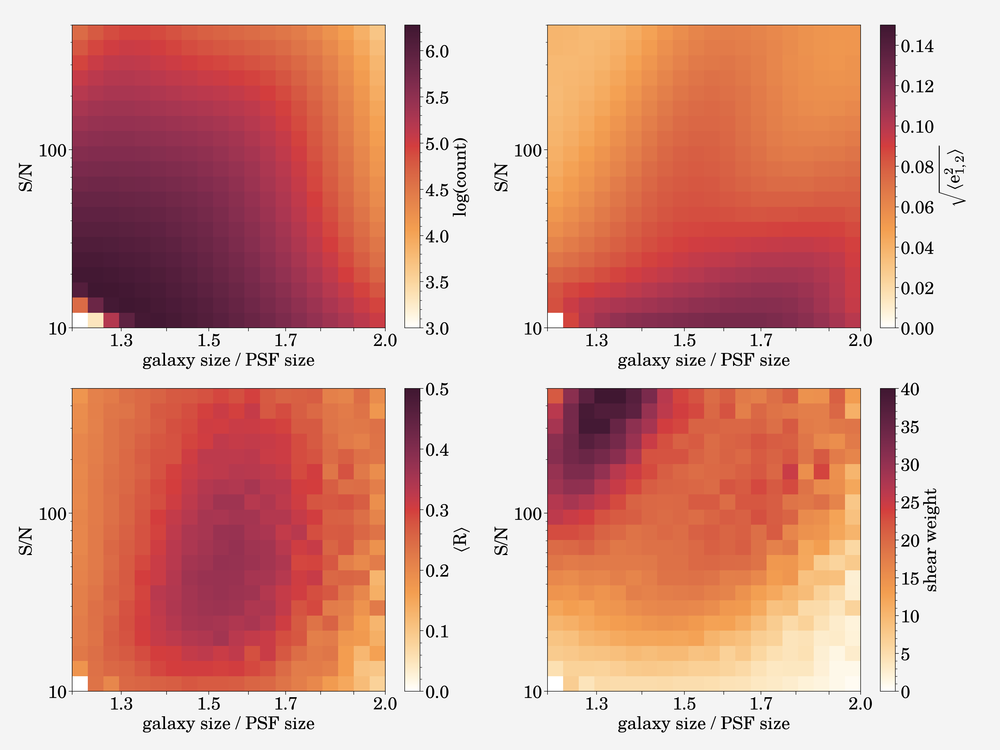

In [8]:
mpl.use('Agg')
font = {'size'   : 20}
mpl.rc('font', **font)
mpl.rc('text', usetex=False)
mpl.rc('font', family='serif')

xedges = res['xedges']
yedges = res['yedges']
count_all = res['count']
new_meanes = res['meanes']
new_response = res['response']
new_shearweight = res['weight']

fig=plt.figure(figsize=(16,12))
ax = plt.subplot(221)
X, Y = np.meshgrid(yedges, xedges)
im = ax.pcolormesh(X, Y, np.log10(count_all), vmin=3)
plt.xscale('log')
plt.yscale('log')
plt.ylabel("S/N")
plt.xlabel("galaxy size / PSF size")
#im.colorbar(label="count")
# im.axes.get_xaxis().set_visible(True)
fig.colorbar(im, ax=ax, label=r"log(count)")
ax.set_xticks(np.array([1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2.]))
# ax.set_xticks(np.array([0.5,0.6,0.7,1.0,1.2,1.6,1.8,1.9,3.]))
ax.set_xticklabels(np.array(['', r'1.3','',r'1.5','',r'1.7','', '',r'2.0']))
# ax.set_xticklabels(np.array(['', r'0.6','',r'1.0','',r'1.6','', '',r'3.0']))

# Eq 9. 
ax = plt.subplot(222)
X, Y = np.meshgrid(yedges, xedges)
im = ax.pcolormesh(X, Y, new_meanes, vmin=0.0, vmax=0.15)
plt.xscale('log')
plt.yscale('log')
plt.ylabel("S/N")
plt.xlabel("galaxy size / PSF size")
# im.axes.get_xaxis().set_visible(True)
fig.colorbar(im, ax=ax, label=r"$\sqrt{\langle e_{1,2}^2\rangle}$")
ax.set_xticks(np.array([1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2.]))
# ax.set_xticks(np.array([0.5,0.6,0.7,1.0,1.2,1.6,1.8,1.9,3.]))
ax.set_xticklabels(np.array(['', r'1.3','',r'1.5','',r'1.7','', '',r'2.0']))
# ax.set_xticklabels(np.array(['', r'0.6','',r'1.0','',r'1.6','', '',r'3.0']))

ax = plt.subplot(223)
X, Y = np.meshgrid(yedges, xedges)
im = ax.pcolormesh(X, Y, new_response, vmin=0.0, vmax=0.5)
plt.xscale('log')
plt.yscale('log')
plt.ylabel("S/N")
plt.xlabel("galaxy size / PSF size")
# im.axes.get_xaxis().set_visible(True)
fig.colorbar(im, ax=ax, label=r"$\langle$R$\rangle$")
ax.set_xticks(np.array([1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2.]))
# ax.set_xticks(np.array([0.5,0.6,0.7,1.0,1.2,1.6,1.8,1.9,3.]))
ax.set_xticklabels(np.array(['', r'1.3','',r'1.5','',r'1.7','', '',r'2.0']))
# ax.set_xticklabels(np.array(['', r'0.6','',r'1.0','',r'1.6','', '',r'3.0']))

ax = plt.subplot(224)
X, Y = np.meshgrid(yedges, xedges)
im = ax.pcolormesh(X, Y, new_shearweight, vmin=0, vmax=40)
plt.xscale('log')
plt.yscale('log')
plt.ylabel("S/N")
plt.xlabel("galaxy size / PSF size")
# im.axes.get_xaxis().get_ticklabels()[3].set_visible(False)
fig.colorbar(im, ax=ax, label="shear weight")

#plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
# plt.minorticks_off() 
ax.set_xticks(np.array([1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2.]))
# ax.set_xticks(np.array([0.5,0.6,0.7,1.0,1.2,1.6,1.8,1.9,3.]))
ax.set_xticklabels(np.array(['', r'1.3','',r'1.5','',r'1.7','', '',r'2.0']))
# ax.set_xticklabels(np.array(['', r'0.6','',r'1.0','',r'1.6','', '',r'3.0']))
plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v2/count_response_ellip_SNR_Tr_final_v2_1.pdf', bbox_inches='tight')

# 2. Mean shear variations in focal plane coordinates

In [61]:
with open('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/shear_variations/mdet_shear_focal_plane_all.pickle', 'rb') as raw:
    ccdres_all = pickle.load(raw)

import drawDECam.drawDECam as dDECam
x0 = dDECam.CCDSECTION_X0
y0 = dDECam.CCDSECTION_Y0
name = 'e2' # 'e1'
trim = False
rotate=False
label=False
ccd_x_min = 48
ccd_x_max = 2000
ccd_y_min = 48
ccd_y_max = 4048
cell_side = 32
x_side = int(np.ceil((ccd_x_max - ccd_x_min)/cell_side))
y_side = int(np.ceil((ccd_y_max - ccd_y_min)/cell_side))

def _compute_g1_g2(ccdres, ccdnum):
    g1 = ccdres[ccdnum]["g1"] / ccdres[ccdnum]["num_g1"]
    g1p = ccdres[ccdnum]["g1p"] / ccdres[ccdnum]["num_g1p"]
    g1m = ccdres[ccdnum]["g1m"] / ccdres[ccdnum]["num_g1m"]
    R11 = (g1p - g1m) / 2 / 0.01

    g2 = ccdres[ccdnum]["g2"] / ccdres[ccdnum]["num_g2"]
    g2p = ccdres[ccdnum]["g2p"] / ccdres[ccdnum]["num_g2p"]
    g2m = ccdres[ccdnum]["g2m"] / ccdres[ccdnum]["num_g2m"]
    R22 = (g2p - g2m) / 2 / 0.01
    
    return g1/R11, g2/R22

def _compute_g1_g2_per_ccd(ccdres):
    g1 = ccdres["g1"] / ccdres["num_g1"]
    g1p = ccdres["g1p"] / ccdres["num_g1p"]
    g1m = ccdres["g1m"] / ccdres["num_g1m"]
    R11 = (g1p - g1m) / 2 / 0.01

    g2 = ccdres["g2"] / ccdres["num_g2"]
    g2p = ccdres["g2p"] / ccdres["num_g2p"]
    g2m = ccdres["g2m"] / ccdres["num_g2m"]
    R22 = (g2p - g2m) / 2 / 0.01
    
    return g1/R11, g2/R22

def compute_shear_stack_CCDs(ccdres, x_side, y_side, stack_north_south=False, per_ccd=False, block=False):
    
    shear = {}
    for direct in ['north', 'south']:
        cnames = ['g1', 'g2', 'g1p', 'g1m', 'g2p', 'g2m']
        shear_sum_all = {}
        
        if direct == 'north':
            ccd_list = np.arange(1,32)
        elif direct == 'south':
            ccd_list = np.arange(32,63)
            
        for ccdnum in list(ccd_list):
            if ccdnum not in list(ccdres):
                continue
            for cname in cnames:
                if cname not in list(shear_sum_all):
                    shear_sum_all[cname] = np.zeros((y_side, x_side))
                    shear_sum_all["num_" + cname] = np.zeros((y_side, x_side))
                if cname in list(shear_sum_all):
                    rows,cols = np.where(~np.isnan(ccdres[ccdnum][cname]))
                    np.add.at(shear_sum_all[cname], (rows, cols), ccdres[ccdnum][cname][rows, cols])
                    np.add.at(shear_sum_all["num_"+cname], (rows, cols), ccdres[ccdnum]["num_"+cname][rows, cols])
                    
        if direct == 'north':
            shear['north'] = shear_sum_all
        elif direct == 'south':
            shear['south'] = shear_sum_all

    if not stack_north_south:
        mean_north_g1, mean_north_g2  = _compute_g1_g2_per_ccd(shear['north'])
        mean_south_g1, mean_south_g2  = _compute_g1_g2_per_ccd(shear['south'])
        
        mean_north_g1 = np.rot90(mean_north_g1, 3)
        mean_north_g2 = np.rot90(mean_north_g2, 3)
        mean_south_g1 = np.rot90(mean_south_g1, 3)
        mean_south_g2 = np.rot90(mean_south_g2, 3)
        mean_g1 = [mean_north_g1, mean_south_g1]
        mean_g2 = [mean_north_g2, mean_south_g2]
        return mean_g1, mean_g2
    else:
        # Stack north and south but be careful of the directions of stacking.
        shear_stack = {}
        for cname in cnames:
            shear_stack[cname] = np.zeros((y_side, x_side))
            shear_stack["num_" + cname] = np.zeros((y_side, x_side))
            rows,cols = np.where(~np.isnan(shear['north'][cname]))
            np.add.at(shear_stack[cname], (rows, cols), shear['north'][cname][rows, cols])
            np.add.at(shear_stack["num_"+cname], (rows, cols), shear['north']["num_"+cname][rows, cols])
            
            shear_flip = np.flip(shear['south'][cname],0)
            shear_flip_num = shear['south']["num_"+cname]
            rows,cols = np.where(~np.isnan(shear_flip))
            np.add.at(shear_stack[cname], (rows, cols), shear_flip[rows, cols])
            np.add.at(shear_stack["num_"+cname], (rows, cols), shear_flip_num[rows, cols])
        
        if block:
            for cname in list(shear_stack):
                shear_stack[cname] = shear_stack[cname][2:-2, 2:-2]
            return shear_stack
        else:
            g1, g2  = _compute_g1_g2_per_ccd(shear_stack)
            mean_g1 = np.rot90(g1, 3)
            mean_g2 = np.rot90(g2, 3)
            return mean_g1, mean_g2

## 3-1. Lay out 62 CCDs (Use ALL)

<ipython-input-61-a42a1c7b0c2c>:20: RuntimeWarning: invalid value encountered in true_divide
  g1 = ccdres[ccdnum]["g1"] / ccdres[ccdnum]["num_g1"]
<ipython-input-61-a42a1c7b0c2c>:21: RuntimeWarning: invalid value encountered in true_divide
  g1p = ccdres[ccdnum]["g1p"] / ccdres[ccdnum]["num_g1p"]
<ipython-input-61-a42a1c7b0c2c>:22: RuntimeWarning: invalid value encountered in true_divide
  g1m = ccdres[ccdnum]["g1m"] / ccdres[ccdnum]["num_g1m"]
<ipython-input-61-a42a1c7b0c2c>:25: RuntimeWarning: invalid value encountered in true_divide
  g2 = ccdres[ccdnum]["g2"] / ccdres[ccdnum]["num_g2"]
<ipython-input-61-a42a1c7b0c2c>:26: RuntimeWarning: invalid value encountered in true_divide
  g2p = ccdres[ccdnum]["g2p"] / ccdres[ccdnum]["num_g2p"]
<ipython-input-61-a42a1c7b0c2c>:27: RuntimeWarning: invalid value encountered in true_divide
  g2m = ccdres[ccdnum]["g2m"] / ccdres[ccdnum]["num_g2m"]


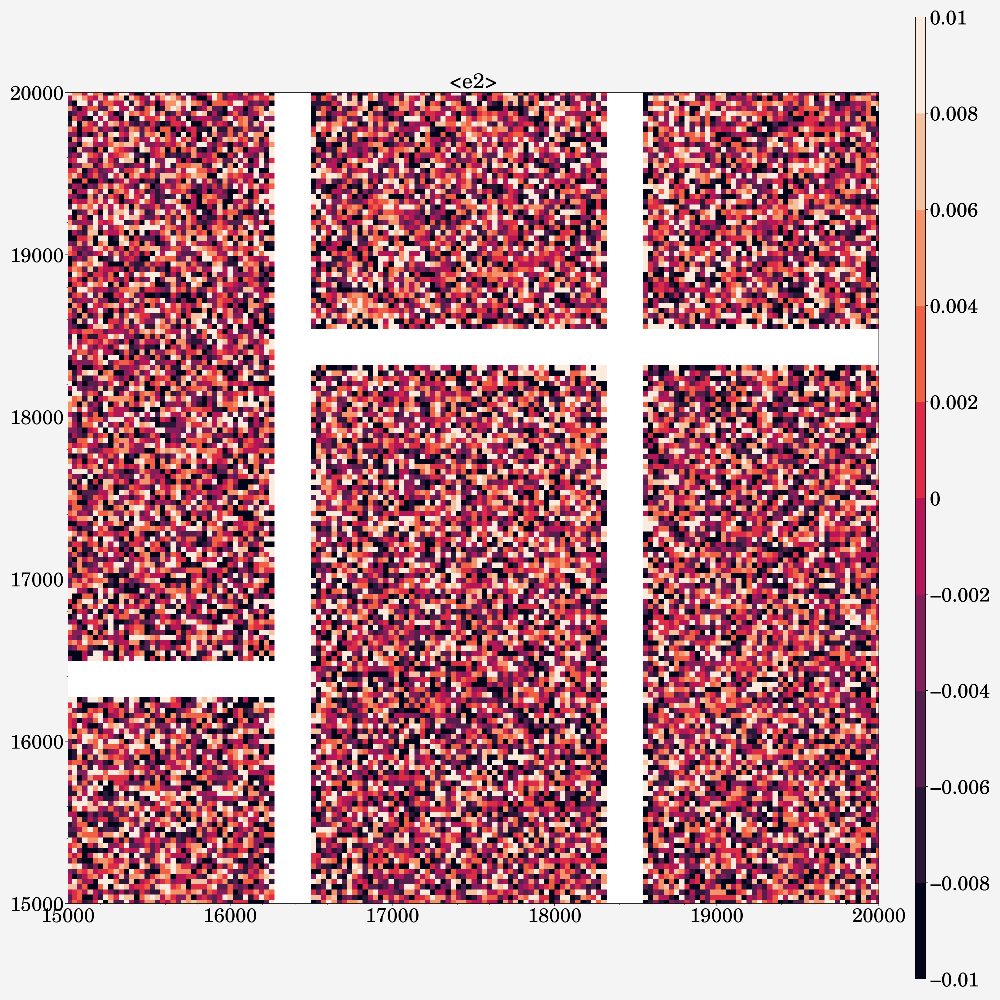

In [75]:

# Draw DECam CCDs using Plot function (Unrotated)
def rotate_xy(x, y, theta, x0=0, y0=0, units='degrees'):
    """
    Rotates (x,y) by angle theta and (x0,y0) translation
    """
    if units == 'degrees':
        d2r = math.pi / 180.  # degrees to radians shorthand
        theta = d2r * theta
    x_new = (x - x0) * math.cos(theta) - (y - y0) * math.sin(theta)
    y_new = (x - x0) * math.sin(theta) + (y - y0) * math.cos(theta)
    return x_new, y_new

"""
Draws DECam CCDs shapes using matplotlib Plot function on the current plot
"""
mpl.rcParams.update({'font.size': 28})
fig = pplt.figure(figsize=(20,20))
ax = fig.subplots()
if trim:
    TRIM_CCDSECTIONS = dDECam.CCDSECTIONS.copy()
    borderpix = 104  # 208/2. as 208 is the space between chips in pixels
    for _k, _v in list(TRIM_CCDSECTIONS.items()):
        (_x1, _x2, _y1, _y2) = _v
        _x1 = _x1 + borderpix
        _x2 = _x2 - borderpix
        _y1 = _y1 + borderpix
        _y2 = _y2 - borderpix
        TRIM_CCDSECTIONS[_k] = [_x1, _x2, _y1, _y2]
    SECTIONS = TRIM_CCDSECTIONS
else:
    SECTIONS = dDECam.CCDSECTIONS

for k, v in list(SECTIONS.items()):
    (x1, x2, y1, y2) = v
    # if rotate:
    #     x1, y1 = rotate_xy(x1, y1, theta=-90, x0=x0, y0=y0)
    #     x2, y2 = rotate_xy(x2, y2, theta=-90, x0=x0, y0=y0)
    # else:
    #     x1, y1 = rotate_xy(x1, y1, theta=0, x0=x0, y0=y0)
    #     x2, y2 = rotate_xy(x2, y2, theta=0, x0=x0, y0=y0)
    if k in list(ccdres_all):
        g1, g2 = _compute_g1_g2(ccdres_all, k)
    else:
        continue
    # Into numpy arrays
    x = np.array([x1, x2, x2, x1, x1])
    y = np.array([y1, y1, y2, y2, y1])

    cmap = plt.get_cmap('rocket')
    # X, Y = np.meshgrid(np.linspace(x1+48, x2-48, x_side+1), np.linspace(y1+48, y2-48, y_side+1))
    X, Y = np.meshgrid(np.linspace(x1+112, x2-112, x_side-3), np.linspace(y1+112, y2-112, y_side-3))
    if name == 'e1':
        mesh = ax.pcolormesh(X, Y, g1[2:-2, 2:-2], vmin=-0.01, vmax=0.01, snap=True, cmap=cmap)
    elif name == 'e2':
        mesh = ax.pcolormesh(X, Y, g2[2:-2, 2:-2], vmin=-0.01, vmax=0.01, snap=True, cmap=cmap)

# ax.set_xlim(-2000,32000)
# ax.set_ylim(-2000,32000)
ax.set_xlim(15000,20000)
ax.set_ylim(15000,20000)
ax.set_aspect(1)
ax.set_title('<'+name+'>')
# plt.tight_layout()
plt.colorbar(mesh, ax=ax)
# plt.savefig('mdet_shear_variations_focal_plane_'+name+'_v2.pdf', bbox_inches='tight')
plt.show()

## 3-2. Stack 1-31 CCDs (North) and 32-62 CCDs (South) (Use ALL)

<ipython-input-61-a42a1c7b0c2c>:33: RuntimeWarning: invalid value encountered in true_divide
  g1 = ccdres["g1"] / ccdres["num_g1"]
<ipython-input-61-a42a1c7b0c2c>:34: RuntimeWarning: invalid value encountered in true_divide
  g1p = ccdres["g1p"] / ccdres["num_g1p"]
<ipython-input-61-a42a1c7b0c2c>:35: RuntimeWarning: invalid value encountered in true_divide
  g1m = ccdres["g1m"] / ccdres["num_g1m"]
<ipython-input-61-a42a1c7b0c2c>:38: RuntimeWarning: invalid value encountered in true_divide
  g2 = ccdres["g2"] / ccdres["num_g2"]
<ipython-input-61-a42a1c7b0c2c>:39: RuntimeWarning: invalid value encountered in true_divide
  g2p = ccdres["g2p"] / ccdres["num_g2p"]
<ipython-input-61-a42a1c7b0c2c>:40: RuntimeWarning: invalid value encountered in true_divide
  g2m = ccdres["g2m"] / ccdres["num_g2m"]
<ipython-input-69-ae80d420ff52>:55: ProplotWarning: fig.subplots_adjust() has no effect on proplot figures. To set the left, right, bottom, top, wspace, or hspace gridspec values, pass them as key

<Figure size 400x400 with 0 Axes>

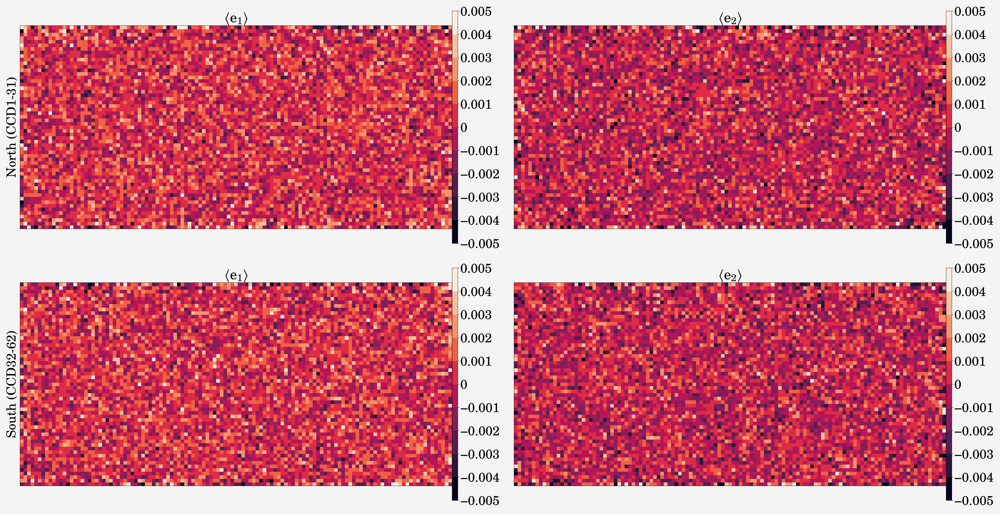

In [69]:

mean_g1, mean_g2 = compute_shear_stack_CCDs(ccdres_all, x_side, y_side, stack_north_south=False)
for i in range(2):
    mean_g1[i] = mean_g1[i][2:-2, 2:-2]
    mean_g2[i] = mean_g2[i][2:-2, 2:-2]

plt.clf()
mpl.rcParams.update({'font.size': 32})
fig = pplt.figure(figsize=(35,18), sharex=False, sharey=False)
ax1 = fig.subplots(nrows=2, ncols=2)

cmap = plt.get_cmap('rocket')
# cmap.set_bad(color='k', alpha=1.)
piece_side = 32
X, Y = np.meshgrid(np.linspace(1, 3873, (3872//piece_side)+1), np.linspace(1, 1825, (1824//piece_side)+1))

mean = np.nanmean(mean_g1[0])
sig = np.nanstd(mean_g1[0]) / np.sqrt(mean_g1[0].size)
mesh = ax1[0,0].pcolormesh(X,Y,mean_g1[0], vmin=-0.005, vmax=0.005, cmap=cmap)
ax1[0,0].set_aspect(1)
ax1[0,0].set_title(r'$\langle e_{1} \rangle$')
ax1[0,0].set_xticks([])
ax1[0,0].set_yticks([])
ax1[0,0].set_ylabel('North (CCD1-31)')
plt.colorbar(mesh, ax=ax1[0,0], pad=0.01)

mean = np.nanmean(mean_g2[0])
sig = np.nanstd(mean_g2[0]) / np.sqrt(mean_g2[0].size)
mesh = ax1[0,1].pcolormesh(X,Y,mean_g2[0], vmin=-0.005, vmax=0.005, cmap=cmap)
ax1[0,1].set_aspect(1)
ax1[0,1].set_title(r'$\langle e_{2} \rangle$')
ax1[0,1].set_xticks([])
ax1[0,1].set_yticks([])
plt.colorbar(mesh, ax=ax1[0,1], pad=0.01)

mean = np.nanmean(mean_g1[1])
sig = np.nanstd(mean_g1[1]) / np.sqrt(mean_g1[1].size)
mesh = ax1[1,0].pcolormesh(X,Y,mean_g1[1], vmin=-0.005, vmax=0.005, cmap=cmap)
ax1[1,0].set_aspect(1)
ax1[1,0].set_title(r'$\langle e_{1} \rangle$')
ax1[1,0].set_xticks([])
ax1[1,0].set_yticks([])
ax1[1,0].set_ylabel('South (CCD32-62)')
plt.colorbar(mesh, ax=ax1[1,0], pad=0.01)


mean = np.nanmean(mean_g2[1][mean_g2[1] > -10])
sig = np.nanstd(mean_g2[1][mean_g2[1] > -10]) / np.sqrt(mean_g2[1][mean_g2[1] > -10].size)
mesh = ax1[1,1].pcolormesh(X,Y,mean_g2[1], vmin=-0.005, vmax=0.005, cmap=cmap)
ax1[1,1].set_aspect(1)
ax1[1,1].set_title(r'$\langle e_{2} \rangle$')
ax1[1,1].set_xticks([])
ax1[1,1].set_yticks([])
plt.colorbar(mesh, ax=ax1[1,1], pad=0.01)

plt.subplots_adjust(hspace=0.3,wspace=0.1)
# plt.savefig('mdet_shear_variations_focal_plane_stacked_north_south_v2.pdf', bbox_inches='tight')

[]
[]
[]
[]


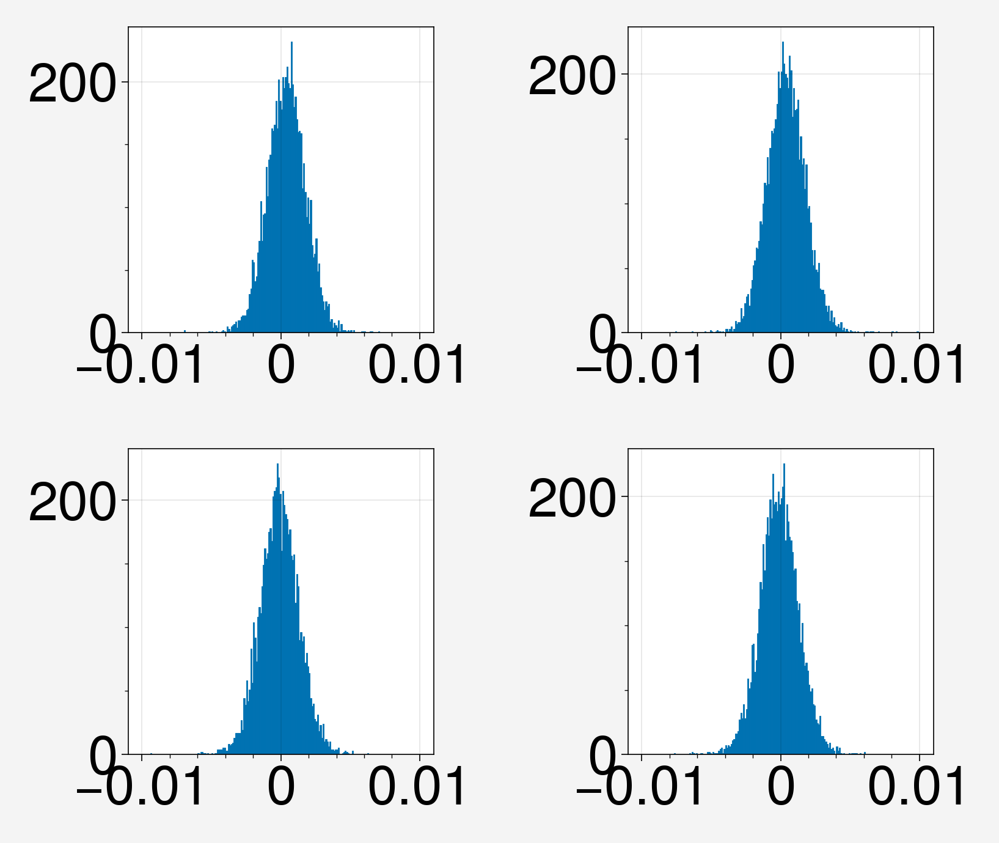

In [ ]:
fig = pplt.figure(sharex=False, sharey=False)
ax = fig.subplots(nrows=2,ncols=2)
for i,g in enumerate([mean_g1, mean_g2]):
    for j in range(2):
        ax[i,j].hist(g[j].flatten(), bins=200, range=(-0.01, 0.01))
        print(g[j][g[j] < -0.05])
plt.show()

## 3-3. Stack all 62 CCDs together (Use per-CCD and ALL files)

<ipython-input-61-a42a1c7b0c2c>:33: RuntimeWarning: invalid value encountered in true_divide
  g1 = ccdres["g1"] / ccdres["num_g1"]
<ipython-input-61-a42a1c7b0c2c>:34: RuntimeWarning: invalid value encountered in true_divide
  g1p = ccdres["g1p"] / ccdres["num_g1p"]
<ipython-input-61-a42a1c7b0c2c>:35: RuntimeWarning: invalid value encountered in true_divide
  g1m = ccdres["g1m"] / ccdres["num_g1m"]
<ipython-input-61-a42a1c7b0c2c>:38: RuntimeWarning: invalid value encountered in true_divide
  g2 = ccdres["g2"] / ccdres["num_g2"]
<ipython-input-61-a42a1c7b0c2c>:39: RuntimeWarning: invalid value encountered in true_divide
  g2p = ccdres["g2p"] / ccdres["num_g2p"]
<ipython-input-61-a42a1c7b0c2c>:40: RuntimeWarning: invalid value encountered in true_divide
  g2m = ccdres["g2m"] / ccdres["num_g2m"]


[] []


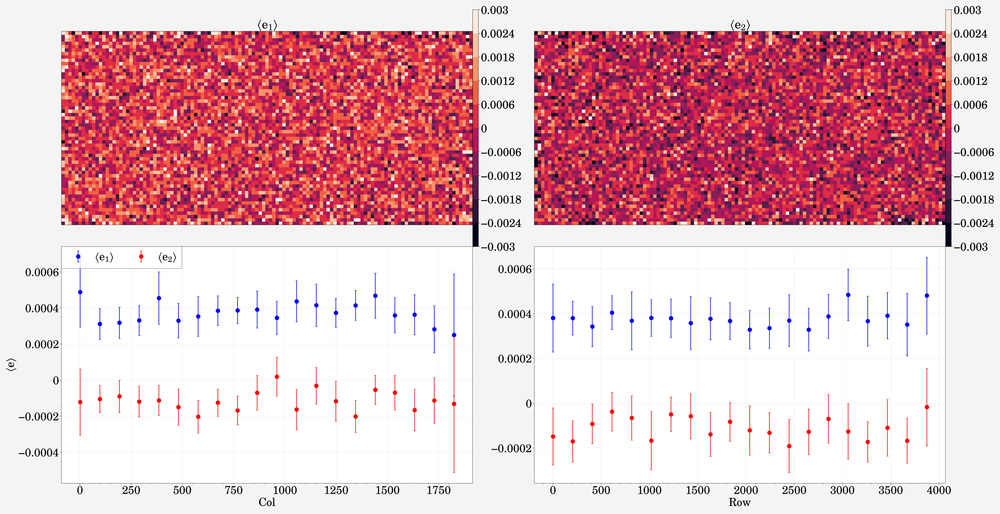

In [84]:

# Stacking 1-62 CCDs
mean_g1, mean_g2 = compute_shear_stack_CCDs(ccdres_all, x_side, y_side, stack_north_south=True)
# Trimming around the edges. 
mean_g1 = mean_g1[2:-2,2:-2]
mean_g2 = mean_g2[2:-2,2:-2]
    
g1_flat = mean_g1.flatten()
g2_flat = mean_g2.flatten()
print(g1_flat[g1_flat < -10], g2_flat[g2_flat < -10])

mpl.rcParams.update({'font.size': 28, 'lines.markersize': 10})
fig = pplt.figure(figsize=(35,18), sharex=False, sharey=False)
ax1 = fig.subplots(nrows=2,ncols=2)
cmap = plt.get_cmap('rocket')

piece_side = 32
X, Y = np.meshgrid(np.linspace(1, 3873, (3872//piece_side)+1), np.linspace(1, 1825, (1824//piece_side)+1))

mean = np.nanmean(mean_g1[mean_g1 > -10])
sig = np.nanstd(mean_g1[mean_g1 > -10]) / np.sqrt(mean_g1[mean_g1 > -10].size)
mesh = ax1[0,0].pcolormesh(X,Y,mean_g1, vmin=-0.003, vmax=0.003, cmap=cmap)
ax1[0,0].set_aspect(1)
ax1[0,0].set_title(r'$\langle e_{1} \rangle$')
ax1[0,0].set_xticks([])
ax1[0,0].set_yticks([])
plt.colorbar(mesh, ax=ax1[0,0], pad=0.01)

mean = np.nanmean(mean_g2[mean_g2 > -10])
sig = np.nanstd(mean_g2[mean_g2 > -10]) / np.sqrt(mean_g2[mean_g2 > -10].size)
mesh = ax1[0,1].pcolormesh(X,Y,mean_g2, vmin=-0.003, vmax=0.003, cmap=cmap)
ax1[0,1].set_aspect(1)
ax1[0,1].set_title(r'$\langle e_{2} \rangle$')
ax1[0,1].set_xticks([])
ax1[0,1].set_yticks([])
plt.colorbar(mesh, ax=ax1[0,1], pad=0.01)


# Jackknife error estimate.
with open('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/shear_variations/mean_shear_jk_cov.pickle', 'rb') as jk:
    d_mean_shear = pickle.load(jk)

# With jackknife errors.
nbin = 20
x_ = np.linspace(1,3873,nbin)
y_ = np.linspace(1,1825,nbin)

binds = [121*len(elem) for elem in np.array_split(np.arange(57), 20)]
col_n = np.sqrt(binds)
ax1[1,0].errorbar(y_, d_mean_shear['x_g1'], yerr=d_mean_shear['jc_x_g1']/col_n, fmt='o', c='b', label=r'$\langle e_{1} \rangle$')
ax1[1,0].errorbar(y_, d_mean_shear['x_g2'], yerr=d_mean_shear['jc_x_g2']/col_n, fmt='o', c='r', label=r'$\langle e_{2} \rangle$')
ax1[1,0].set_xlabel('Col')
ax1[1,0].legend(loc='upper left')
ax1[1,0].set_ylabel(r'$\langle e \rangle$')

binds = [57*len(elem) for elem in np.array_split(np.arange(121), 20)]
row_n = np.sqrt(binds)
ax1[1,1].errorbar(x_, d_mean_shear['y_g1'], yerr=d_mean_shear['jc_y_g1']/col_n, fmt='o', c='b', label=r'$\langle e_{1} \rangle$')
ax1[1,1].errorbar(x_, d_mean_shear['y_g2'], yerr=d_mean_shear['jc_y_g2']/col_n, fmt='o', c='r', label=r'$\langle e_{2} \rangle$')
ax1[1,1].set_xlabel('Row')
# ax1[1,1].set_ylabel(r'$\langle e_{2} \rangle$')

plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v2/mdet_shear_variations_focal_plane_stacked_xy.pdf', bbox_inches='tight')

# 3. Tangential shear around field centers

In [28]:
import treecorr
from scipy import linalg
ng = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/v2/wmom_field_centers_cross_correlation_final_output.fits')
fc = fio.read('/global/cscratch1/sd/myamamot/pizza-slice/exposure_field_centers.fits')

In [ ]:
fig = pplt.figure(figsize=(7,5))
ax = fig.subplots(nrows=1, ncols=1)
fc['RA_CENT'][fc['RA_CENT'] > 180] -= 360
ax.scatter(fc['RA_CENT'], fc['DEC_CENT'], s=1)
ax.set_title('Field Centers')
ax.set_xlabel('RA')
ax.set_ylabel('DEC')

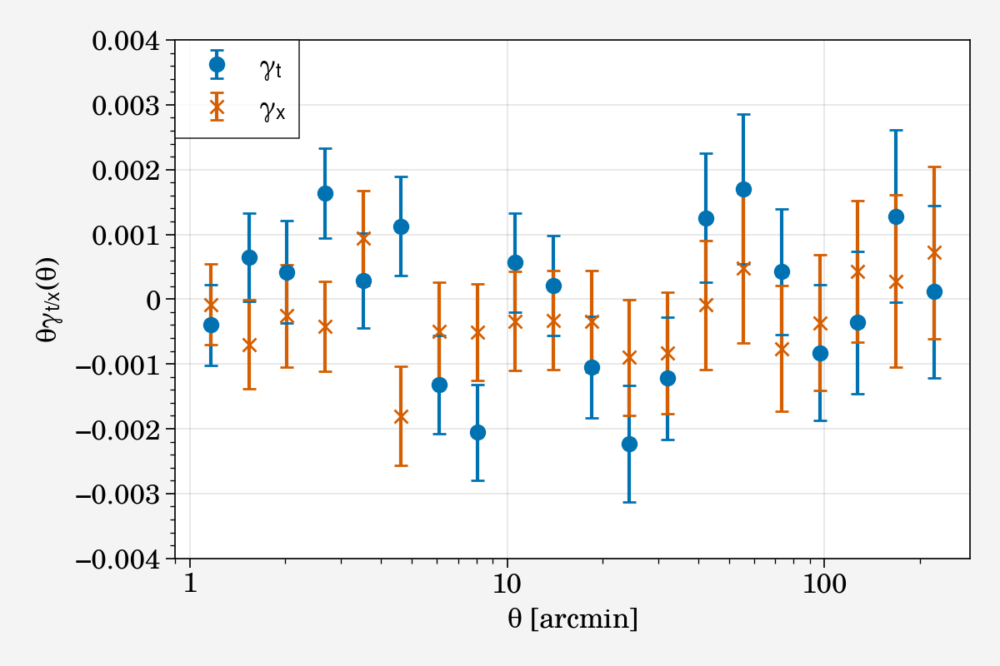

In [31]:
matplotlib.rcParams.update({'font.size':12})
fig,ax = plt.subplots(figsize=(6,4))
ax.errorbar(ng['meanr'], ng['meanr']*ng['gamT'], yerr=ng['meanr']*ng['sigma'], fmt='o', label=r'$\gamma_{\rm t}$')
ax.errorbar(ng['meanr'], ng['meanr']*ng['gamX'], yerr=ng['meanr']*ng['sigma'], fmt='x', label=r'$\gamma_{\rm x}$')
ax.set_ylabel(r'$\theta\gamma_{\rm t/x}(\theta)$')
ax.set_xlabel(r'$\theta$ [arcmin]')

ax.set_ylim(-0.004, 0.004)
ax.set_xscale('log')
ax.legend(loc='upper left')

plt.tight_layout()
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v2/tangential_shear_around_field_centers_weighted.pdf', bbox_inches='tight')

reduced chi2 with diagonal part of covariance matrix (gamT) 36.085274882660606 dof 20
reduced chi2 with diagonal part of covariance matrix (gamX) 13.431200025288563 dof 20
chi2 with full covariance matrix 34.66544343538949 dof 20
chi2 with full covariance matrix 12.557464418643985 dof 20


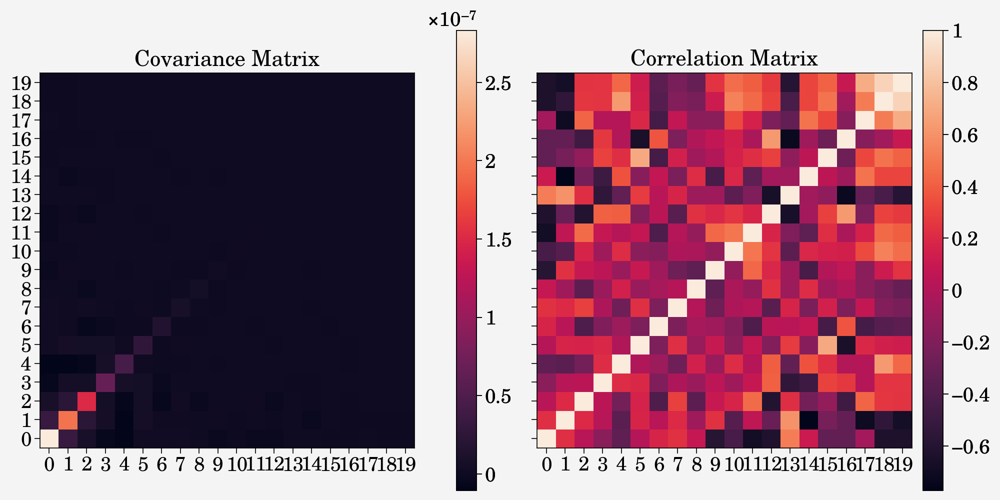

In [30]:
# Compute reduced chi2 from the diagonal part of covariances matrix. 
reduced_chi2_gamT = np.sum(ng['gamT']**2 / ng['sigma']**2)
reduced_chi2_gamX = np.sum(ng['gamX']**2 / ng['sigma']**2)
dof = ng.shape[0]
print('reduced chi2 with diagonal part of covariance matrix (gamT)', reduced_chi2_gamT, 'dof', dof)
print('reduced chi2 with diagonal part of covariance matrix (gamX)', reduced_chi2_gamX, 'dof', dof)

# Compute chi2 and p-value.
ng_cov = np.load('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/v2/wmom_field_centers_cross_correlation_final_output_cov.npy')
c_inv = np.linalg.pinv(ng_cov)
chi2_gamT = ng['gamT'].T @ c_inv @ ng['gamT']
chi2_gamX = ng['gamX'].T @ c_inv @ ng['gamX']
print('chi2 with full covariance matrix', chi2_gamT, 'dof', dof)
print('chi2 with full covariance matrix', chi2_gamX, 'dof', dof)

mpl.rcParams.update({'font.size':14})
fig = pplt.figure(figsize=(10,5))
ax = fig.subplots(nrows=1, ncols=2)

im = ax[0].heatmap(ng_cov, cmap='rocket')
ax[0].colorbar(im, loc='r')
ax[0].set_title('Covariance Matrix')
im2 = ax[1].heatmap(np.corrcoef(ng_cov), cmap='rocket')
ax[1].colorbar(im2, loc='r')
ax[1].set_title('Correlation Matrix')
plt.show()

# 4. Tangential/Cross-component shear around bright/faint stars. 

## new (with random point)

In [42]:
from scipy import linalg
ng_bright = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/v2/wmom_stars_shear_cross_correlation_final_output_bright.fits')
ng_faint = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/v2/wmom_stars_shear_cross_correlation_final_output_faint.fits')

In [21]:
ng_bright.dtype

dtype([('r_nom', '>f8'), ('meanr', '>f8'), ('meanlogr', '>f8'), ('gamT', '>f8'), ('gamX', '>f8'), ('sigma', '>f8'), ('weight', '>f8'), ('npairs', '>f8')])

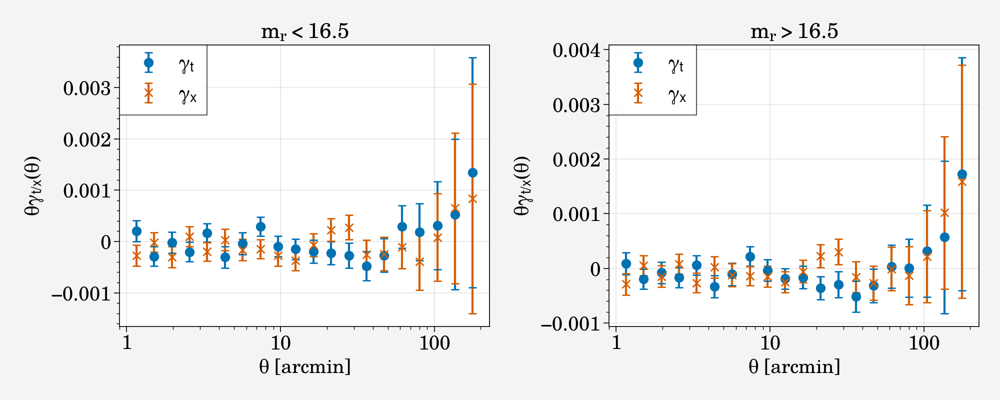

In [44]:
matplotlib.rcParams.update({'font.size':14})
fig,ax = plt.subplots(nrows=1, ncols=2, figsize=(10,4))
ax[0].errorbar(ng_bright['meanr'], ng_bright['meanr']*ng_bright['gamT'], yerr=ng_bright['meanr']*ng_bright['sigma'], fmt='o', label=r'$\gamma_{\rm t}$')
ax[0].errorbar(ng_bright['meanr'], ng_bright['meanr']*ng_bright['gamX'], yerr=ng_bright['meanr']*ng_bright['sigma'], fmt='x', label=r'$\gamma_{\rm x}$')
ax[0].set_ylabel(r'$\theta\gamma_{\rm t/x}(\theta)$')
ax[0].set_xlabel(r'$\theta$ [arcmin]')
ax[0].set_title(r'$m_{r} < 16.5$')
ax[0].set_xscale('log')
ax[0].legend(loc='upper left')

ax[1].errorbar(ng_faint['meanr'], ng_faint['meanr']*ng_faint['gamT'], yerr=ng_faint['meanr']*ng_faint['sigma'], fmt='o', label=r'$\gamma_{\rm t}$')
ax[1].errorbar(ng_faint['meanr'], ng_faint['meanr']*ng_faint['gamX'], yerr=ng_faint['meanr']*ng_faint['sigma'], fmt='x', label=r'$\gamma_{\rm x}$')
ax[1].set_ylabel(r'$\theta\gamma_{\rm t/x}(\theta)$')
ax[1].set_xlabel(r'$\theta$ [arcmin]')
ax[1].set_title(r'$m_{r} > 16.5$')
ax[1].set_xscale('log')
ax[1].legend(loc='upper left')

plt.tight_layout()
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v2/tangential_shear_around_stars_v2_weighted.pdf', bbox_inches='tight')

In [45]:
# Compute reduced chi2 from the diagonal part of covariances matrix. 
reduced_chi2_gamT = np.sum(ng_bright['gamT']**2 / ng_bright['sigma']**2)
reduced_chi2_gamX = np.sum(ng_bright['gamX']**2 / ng_bright['sigma']**2)
dof = ng_bright.shape[0]
print('gamT: reduced chi2 with diagonal part of covariance matrix', reduced_chi2_gamT, 'dof', dof)
print('gamX: reduced chi2 with diagonal part of covariance matrix', reduced_chi2_gamX, 'dof', dof)

reduced_chi2_gamT = np.sum(ng_faint['gamT']**2 / ng_faint['sigma']**2)
reduced_chi2_gamX = np.sum(ng_faint['gamX']**2 / ng_faint['sigma']**2)
dof = ng_faint.shape[0]
print('gamT: reduced chi2 with diagonal part of covariance matrix', reduced_chi2_gamT, 'dof', dof)
print('gamX: reduced chi2 with diagonal part of covariance matrix', reduced_chi2_gamX, 'dof', dof)


# Compute chi2 and p-value. 
# c_inv = np.linalg.pinv(ng_cov)
# chi2 = ng['gamT'].T @ c_inv @ ng['gamT']
# print('chi2 with full covariance matrix', chi2, 'dof', dof)

gamT: reduced chi2 with diagonal part of covariance matrix 18.46763143966401 dof 20
gamX: reduced chi2 with diagonal part of covariance matrix 16.890350969432163 dof 20
gamT: reduced chi2 with diagonal part of covariance matrix 18.531807511609244 dof 20
gamX: reduced chi2 with diagonal part of covariance matrix 13.484093646137492 dof 20


## old (without random point)

In [ ]:
# measurement file
ng_bright = fio.read('/global/cscratch1/sd/myamamot/metadetect/stars_shear_cross_correlation_output_0.fits')
cov_bright = np.load('/global/cscratch1/sd/myamamot/metadetect/stars_shear_cross_correlation_cov_0.npy')
ng_faint = fio.read('/global/cscratch1/sd/myamamot/metadetect/stars_shear_cross_correlation_output_1.fits')
cov_faint = np.load('/global/cscratch1/sd/myamamot/metadetect/stars_shear_cross_correlation_cov_1.npy')

In [ ]:
plt.clf()
mpl.rcParams.update({'font.size':20})
fig = pplt.figure(figsize=(15,7), sharex=False)
ax = fig.subplots(nrows=1, ncols=2)

ax[0].errorbar(ng_bright['meanr'], ng_bright['gamT'], yerr=ng_bright['sigma'], fmt='o', label=r'$\gamma_{\rm t}$')
ax[0].errorbar(ng_bright['meanr'], ng_bright['gamX'], yerr=ng_bright['sigma'], fmt='x', label=r'$\gamma_{\rm x}$')
ax[0].set_ylabel(r'$\gamma_{\rm t}(\theta), \gamma_{\rm x}(\theta)$')
ax[0].set_title('Bright stars [m<16.5]')
ax[0].legend(loc='lower right')
ax[0].set_xlabel(r'$\theta [arcmin]$')
ax[0].set_xscale('log')


ax[1].errorbar(ng_faint['meanr'], ng_faint['gamT'], yerr=ng_faint['sigma'], fmt='o', label=r'$\gamma_{\rm t}$')
ax[1].errorbar(ng_faint['meanr'], ng_faint['gamX'], yerr=ng_faint['sigma'], fmt='x', label=r'$\gamma_{\rm x}$')
ax[1].set_ylabel(r'$\gamma_{\rm t}(\theta), \gamma_{\rm x}(\theta)$')
ax[1].set_title('Faint stars [m>16.5]')
ax[1].set_xlabel(r'$\theta [arcmin]$')
ax[1].set_xscale('log')

fig.suptitle('Tangential and Cross-component shear around stars')
plt.tight_layout()
plt.savefig('tangential_shear_around_stars_v2.pdf', bbox_inches='tight')
plt.show()

# 5. Rho- and tau-statistics

In [ ]:
def pretty_rho1(meanr, rho, sig, sqrtn, rho3=None, sig3=None, rho4=None, sig4=None, gband=False):
    
    plt.plot(meanr, rho, color='blue')
    plt.plot(meanr, -rho, color='blue', ls=':')
    plt.errorbar(meanr[rho>0], rho[rho>0], yerr=sig[rho>0]/sqrtn, color='blue', ls='', marker='o')
    plt.errorbar(meanr[rho<0], -rho[rho<0], yerr=sig[rho<0]/sqrtn, color='blue', ls='', marker='o')
    rho1_line = plt.errorbar(-meanr, rho, yerr=sig, color='blue', marker='o')
    if rho3 is not None:
        plt.plot(meanr*1.03, rho3, color='green')
        plt.plot(meanr*1.03, -rho3, color='green', ls=':')
        plt.errorbar(meanr[rho3>0]*1.03, rho3[rho3>0], yerr=sig3[rho3>0]/sqrtn, color='green', ls='', marker='s')
        plt.errorbar(meanr[rho3<0]*1.03, -rho3[rho3<0], yerr=sig3[rho3<0]/sqrtn, color='green', ls='', marker='s')
        rho3_line = plt.errorbar(-meanr, rho3, yerr=sig3, color='green', marker='s')
    if rho4 is not None:
        plt.plot(meanr*1.06, rho4, color='red')
        plt.plot(meanr*1.06, -rho4, color='red', ls=':')
        plt.errorbar(meanr[rho4>0]*1.06, rho4[rho4>0], yerr=sig4[rho4>0]/sqrtn, color='red', ls='', marker='^')
        plt.errorbar(meanr[rho4<0]*1.06, -rho4[rho4<0], yerr=sig4[rho4<0]/sqrtn, color='red', ls='', marker='^')
        rho4_line = plt.errorbar(-meanr, rho4, yerr=sig4, color='red', marker='^')
    #sv_req = mp.Patch(color='#FFFF82')
    if rho3 is not None and rho4 is not None:
        if gband:
            loc = 'upper right'
            fontsize = 18
        else:
            loc = 'upper right'
            fontsize = 24
        plt.legend([rho1_line, rho3_line, rho4_line],
                   [r'$\rho_1(\theta)$', r'$\rho_3(\theta)$', r'$\rho_4(\theta)$'],
                   loc=loc, fontsize=fontsize)
        plt.ylim( [1.e-10, 1.e-5] )

    plt.tick_params(axis='both', which='major', labelsize=24)
    plt.xlim( [0.5,300.] )
    plt.xlabel(r'$\theta$ (arcmin)', fontsize=24)
    plt.ylabel(r'$\rho(\theta)$', fontsize=24)
    plt.xscale('log')
    plt.yscale('log', nonposy='clip')
    plt.tight_layout()
    plt.show()

def pretty_rho2(meanr, rho, sig, sqrtn, rho5=None, sig5=None, gband=False):
    import matplotlib.patches as mp

    plt.plot(meanr, rho, color='blue')
    plt.plot(meanr, -rho, color='blue', ls=':')
    plt.errorbar(meanr[rho>0], rho[rho>0], yerr=sig[rho>0]/sqrtn, color='blue', ls='', marker='o')
    plt.errorbar(meanr[rho<0], -rho[rho<0], yerr=sig[rho<0]/sqrtn, color='blue', ls='', marker='o')
    rho2_line = plt.errorbar(-meanr, rho, yerr=sig, color='blue', marker='o')
    if rho5 is not None:
        plt.plot(meanr*1.03, rho5, color='green')
        plt.plot(meanr*1.03, -rho5, color='green', ls=':')
        plt.errorbar(meanr[rho5>0]*1.03, rho5[rho5>0], yerr=sig5[rho5>0]/sqrtn, color='green', ls='', marker='s')
        plt.errorbar(meanr[rho5<0]*1.03, -rho5[rho5<0], yerr=sig5[rho5<0]/sqrtn, color='green', ls='', marker='s')
        rho5_line = plt.errorbar(-meanr, rho5, yerr=sig5, color='green', marker='s')
    #sv_req = mp.Patch(color='#FFFF82')
    if rho5 is not None:
        if gband:
            loc = 'lower right'
            fontsize = 18
        else:
            loc = 'upper right'
            fontsize = 24
        plt.legend([rho2_line, rho5_line],
                   [r'$\rho_2(\theta)$', r'$\rho_5(\theta)$'],
                   loc=loc, fontsize=fontsize)
        #plt.ylim( [1.e-7, 5.e-4] )
        plt.ylim( [1.e-8, 1.e-5] )
    elif True: # For paper
        plt.legend([rho2_line, sv_req],
                   [r'$\rho_2(\theta)$', r'Requirement'],
                   loc='upper right')
        plt.ylim( [1.e-7, 5.e-4] )
    else:
        plt.legend([rho2_line, sv_req],
                   [r'$\rho_2(\theta)$',
                    r'Requirements for $d\sigma_8/\sigma_8 < 0.03$'],
                   loc='upper right')
        plt.ylim( [1.e-7, 3.e-4] )
    plt.tick_params(axis='both', which='major', labelsize=24)
    plt.xlim( [0.5,300.] )
    plt.xlabel(r'$\theta$ (arcmin)', fontsize=24)
    plt.ylabel(r'$\rho(\theta)$', fontsize=24)
    plt.xscale('log')
    plt.yscale('log', nonposy='clip')
    plt.tight_layout()
    plt.show()

def pretty_rho0(meanr, rho, sig, sqrtn):
    import matplotlib.patches as mp
    plt.plot(meanr, rho, color='blue')
    plt.plot(meanr, -rho, color='blue', ls=':')
    plt.errorbar(meanr[rho>0], rho[rho>0], yerr=sig[rho>0]/sqrtn, color='blue', ls='', marker='o')
    plt.errorbar(meanr[rho<0], -rho[rho<0], yerr=sig[rho<0]/sqrtn, color='blue', ls='', marker='o')
    rho0_line = plt.errorbar(-meanr, rho, yerr=sig, color='blue', marker='o')
    if True:
        plt.legend([rho0_line],
                   [r'$\rho_0(\theta)$'],
                   loc='upper right', fontsize=24)
        plt.ylim( [1.e-6, 1.e-3] )
    plt.tick_params(axis='both', which='major', labelsize=24)
    plt.xlim( [0.5,300.] )
    plt.xlabel(r'$\theta$ (arcmin)', fontsize=24)
    plt.ylabel(r'$\rho(\theta)$', fontsize=24)
    plt.xscale('log')
    plt.yscale('log', nonposy='clip')
    plt.tight_layout()
    plt.show()

def pretty_tau(meanr, rho, sig, sqrtn, tau2=None, sig2=None, tau5=None, sig5=None, gband=False):
    import matplotlib.patches as mp
    
    plt.plot(meanr, rho, color='blue')
    plt.plot(meanr, -rho, color='blue', ls=':')
    plt.errorbar(meanr[rho>0], rho[rho>0], yerr=sig[rho>0]/sqrtn, color='blue', ls='', marker='o')
    plt.errorbar(meanr[rho<0], -rho[rho<0], yerr=sig[rho<0]/sqrtn, color='blue', ls='', marker='o')
    tau0_line = plt.errorbar(-meanr, rho, yerr=sig, color='blue', marker='o')
    if tau2 is not None:
        plt.plot(meanr*1.03, tau2, color='green')
        plt.plot(meanr*1.03, -tau2, color='green', ls=':')
        plt.errorbar(meanr[tau2>0]*1.03, tau2[tau2>0], yerr=sig2[tau2>0]/sqrtn, color='green', ls='', marker='s')
        plt.errorbar(meanr[tau2<0]*1.03, -tau2[tau2<0], yerr=sig2[tau2<0]/sqrtn, color='green', ls='', marker='s')
        tau2_line = plt.errorbar(-meanr, tau2, yerr=sig2, color='green', marker='s')
    if tau5 is not None:
        plt.plot(meanr*1.06, tau5, color='red')
        plt.plot(meanr*1.06, -tau5, color='red', ls=':')
        plt.errorbar(meanr[tau5>0]*1.06, tau5[tau5>0], yerr=sig5[tau5>0]/sqrtn, color='red', ls='', marker='^')
        plt.errorbar(meanr[tau5<0]*1.06, -tau5[tau5<0], yerr=sig5[tau5<0]/sqrtn, color='red', ls='', marker='^')
        tau5_line = plt.errorbar(-meanr, tau5, yerr=sig5, color='red', marker='^')
    
    if tau2 is not None and tau5 is not None:
        if gband:
            loc = 'upper right'
            fontsize = 18
        else:
            loc = 'upper right'
            fontsize = 24
        plt.legend([tau0_line, tau2_line, tau5_line],
                   [r'$\tau_0(\theta)$', r'$\tau_2(\theta)$', r'$\tau_5(\theta)$'],
                   loc=loc, fontsize=fontsize)
        plt.ylim( [1.e-10, 1.e-4] )
    elif True:
        plt.legend([tao0_line],
                   [r'$\tau_0(\theta)$'],
                   loc='upper right', fontsize=24)
        plt.ylim( [1.e-6, 1.e-3] )
    plt.tick_params(axis='both', which='major', labelsize=24)
    plt.xlim( [0.5,300.] )
    plt.xlabel(r'$\theta$ (arcmin)', fontsize=24)
    plt.ylabel(r'$\tau (\theta)$', fontsize=24)
    plt.xscale('log')
    plt.yscale('log', nonposy='clip')
    plt.tight_layout()

In [ ]:
def plot_overall_rho(work, name):

    base_keys = ['griz']
    keys = [ name+'_' + k for k in base_keys ]

    for key in keys:
        stat_file = os.path.join(work, "rho_" + key + ".json")
        if not os.path.isfile(stat_file):
            print('File not found: ',stat_file,' (skipping)')
            continue

        # Read the json file 
        print('Read %s'%stat_file)
        with open(stat_file,'r') as f:
            stats = json.load(f)

        #print' stats = ',stats
        if len(stats) == 1:  # I used to save a list of length 1 that in turn was a list
            stats = stats[0]

        print('len(stats) = ',len(stats))
        ( meanlogr,
          rho1p,
          rho1p_im,
          rho1m,
          rho1m_im,
          var1p,
          var1m,
          rho2p,
          rho2p_im,
          rho2m,
          rho2m_im,
          var2p,
          var2m,
          rho3p,
          rho3p_im,
          rho3m,
          rho3m_im,
          var3p,
          var3m,
          rho4p,
          rho4p_im,
          rho4m,
          rho4m_im,
          var4p,
          var4m,
          rho5p,
          rho5p_im,
          rho5m,
          rho5m_im,
          var5p,
          var5m,
        ) = stats[:31]

        meanr = np.exp(meanlogr)
        rho1p = np.array(rho1p)
        rho1m = np.array(rho1m)
        rho2p = np.array(rho2p)
        rho2m = np.array(rho2m)
        rho3p = np.array(rho3p)
        rho3m = np.array(rho3m)
        rho4p = np.array(rho4p)
        rho4m = np.array(rho4m)
        rho5p = np.array(rho5p)
        rho5m = np.array(rho5m)
        sig_rho1 = np.sqrt(var1p)
        sig_rho2 = np.sqrt(var2p)
        sig_rho3 = np.sqrt(var3p)
        sig_rho4 = np.sqrt(var4p)
        sig_rho5 = np.sqrt(var5p)
        sqrtn = 1

        cols = [meanr,
                rho1p, rho1m, sig_rho1,
                rho2p, rho2m, sig_rho2,
                rho3p, rho3m, sig_rho3,
                rho4p, rho4m, sig_rho4,
                rho5p, rho5m, sig_rho5]
        header = ('meanr  '+
                  'rho1  rho1_xim  sig_rho1  '+
                  'rho2  rho2_xim  sig_rho2  '+
                  'rho3  rho3_xim  sig_rho3  '+
                  'rho4  rho4_xim  sig_rho4  '+
                  'rho5  rho5_xim  sig_rho5  ')

        if len(stats) > 31:
            ( rho0p,
              rho0p_im,
              rho0m,
              rho0m_im,
              var0p,
              var0m,
            ) = stats[31:37]
            rho0p = np.array(rho0p)
            rho0m = np.array(rho0m)
            sig_rho0 = np.sqrt(var0p)
            cols += [rho0p, rho0m, sig_rho0]
            header += 'rho0  rho0_xim  sig_rho0  '

        outfile = '/global/cscratch1/sd/myamamot/metadetect/rho_tau_stats/'+'rho_' + key + '.dat'
        np.savetxt(outfile, np.array(cols), fmt='%.6e', header=header)
        print('wrote',outfile)
 
        plt.clf()
        pretty_rho1(meanr, rho1p, sig_rho1, sqrtn, rho3p, sig_rho3, rho4p, sig_rho4,
                    gband=(key.endswith('g')))
        # plt.savefig('rho1_' + key + '.pdf')
        
        plt.clf()
        pretty_rho2(meanr, rho2p, sig_rho2, sqrtn, rho5p, sig_rho5,
                    gband=(key.endswith('g')))
        # plt.savefig('rho2_' + key + '.pdf')

        if len(stats) > 31:
            plt.clf()
            pretty_rho0(meanr, rho0p, sig_rho0, sqrtn)
            # plt.savefig('rho0_' + key + '.pdf')
    
def plot_overall_tau(work, name):

    base_keys = ['griz']
    keys = [ name+'_' + k for k in base_keys ]

    for key in keys:
        stat_file = os.path.join(work, "tau_" + key + ".json")
        if not os.path.isfile(stat_file):
            print('File not found: ',stat_file,' (skipping)')
            continue

        # Read the json file 
        print('Read %s'%stat_file)
        with open(stat_file,'r') as f:
            stats = json.load(f)

        #print' stats = ',stats
        if len(stats) == 1:  # I used to save a list of length 1 that in turn was a list
            stats = stats[0]

        print('len(stats) = ',len(stats))
        ( meanlogr,
          tau0p,
          tau0p_im,
          tau0m,
          tau0m_im,
          vart0p,
          vart0m,
          tau2p,
          tau2p_im,
          tau2m,
          tau2m_im,
          vart2p,
          vart2m,
          tau5p,
          tau5p_im,
          tau5m,
          tau5m_im,
          vart5p,
          vart5m,
        ) = stats[:19]
        meanr = np.exp(meanlogr)
        tau0p = np.array(tau0p)
        tau0m = np.array(tau0m)
        tau2p = np.array(tau2p)
        tau2m = np.array(tau2m)
        tau5p = np.array(tau5p)
        tau5m = np.array(tau5m)
        sig_tau0 = np.sqrt(vart0p)
        sig_tau2 = np.sqrt(vart2p)
        sig_tau5 = np.sqrt(vart5p)
        sqrtn = 1
        cols = [meanr, 
                tau0p, tau0m, sig_tau0, 
                tau2p, tau2m, sig_tau2, 
                tau5p, tau5m, sig_tau5]
        header = ('meanr  '+
                  'tau0  tau0_xim  sig_tau0  '+
                  'tau2  tau2_xim  sig_tau2  '+
                  'tau5  tau5_xim  sig_tau5  ')

        outfile = '/global/cscratch1/sd/myamamot/metadetect/rho_tau_stats/'+'tau_' + key + '.dat'
        np.savetxt(outfile, np.array(cols), fmt='%.6e', header=header)
        print('wrote',outfile)
        
        pretty_tau(meanr, tau0p, sig_tau0, sqrtn, tau2p, sig_tau2, tau5p, sig_tau5)
        plt.savefig('tau_' + key + '.pdf')
        plt.show()

In [ ]:
import os,json
from matplotlib import pyplot as plt
import numpy as np

In [ ]:
name = 'all_JK_v3'
plot_overall_rho('/global/cscratch1/sd/myamamot/metadetect/rho_tau_stats', name)

In [ ]:
name = 'all_JK_v3'
plot_overall_tau('/global/cscratch1/sd/myamamot/metadetect/rho_tau_stats', name)

# 6. Mean shear in redshift tomographic bins

In [ ]:
with open('/global/cscratch1/sd/myamamot/metadetect/mean_shear_tomobin_binresponse_e1e2.pickle', 'rb') as ft:
    d = pickle.load(ft)
    
with open('/global/cscratch1/sd/myamamot/metadetect/mdet_bin_psfe1.pickle', 'rb') as f:
    psf1bin = pickle.load(f)
with open('/global/cscratch1/sd/myamamot/metadetect/mdet_bin_psfe2.pickle', 'rb') as f2:
    psf2bin = pickle.load(f2)

In [ ]:
d

In [ ]:
from scipy.optimize import curve_fit
def lin_fit_with_sig(x,y,sig):
    def func(x,m,b):
        return m*x+b
    params=curve_fit(func,x,y,p0=(0.,0.),sigma=sig)
    m,b=params[0]
    merr,berr=np.sqrt(np.diagonal(params[1]))
    return m,b,merr,berr

def lin_fit(x,y):
    def func(x,m,b):
        return m*x+b
    params=curve_fit(func,x,y,p0=(0.,0.))
    m,b=params[0]
    return m,b

def _compute_g1g2(res, bind):
    g1 = res['noshear'][0, bind] / res['num_noshear'][0, bind]
    g1p = res['1p'][0, bind] / res['num_1p'][0, bind]
    g1m = res['1m'][0, bind] / res['num_1m'][0, bind]
    R11 = (g1p - g1m) / 2 / 0.01

    g2 = res['noshear'][1, bind] / res['num_noshear'][1, bind]
    g2p = res['2p'][1, bind] / res['num_2p'][1, bind]
    g2m = res['2m'][1, bind] / res['num_2m'][1, bind]
    R22 = (g2p - g2m) / 2 / 0.01

    return g1/R11, g2/R22

In [ ]:

mpl.rcParams.update({'font.size':20})
fig = pplt.figure(figsize=(16,7), sharex=False, sharey=False)
ax = fig.subplots(nrows=1, ncols=2)
c = ['k','r','b','g','c']

mean_e1 = [np.zeros(15), np.zeros(15), np.zeros(15), np.zeros(15), np.zeros(15)]
mean_e2 = [np.zeros(15), np.zeros(15), np.zeros(15), np.zeros(15), np.zeros(15)]
err_e1 = [np.zeros(15), np.zeros(15), np.zeros(15), np.zeros(15), np.zeros(15)]
err_e2 = [np.zeros(15), np.zeros(15), np.zeros(15), np.zeros(15), np.zeros(15)]
for i,b in enumerate(['bin1', 'bin2', 'bin3', 'bin4', 'all']):
    
    for bind in range(15):
        e1, e2 = _compute_g1g2(d['raw_sum'][b], bind)
        mean_e1[i][bind] = e1
        mean_e2[i][bind] = e2
    err_e1[i] = np.std(d['mean_tile'][b]['g1'], axis=1)/np.sqrt(len(d['mean_tile'][b]['g1'][0]))
    err_e2[i] = np.std(d['mean_tile'][b]['g2'], axis=1)/np.sqrt(len(d['mean_tile'][b]['g2'][0]))

    ax[0].errorbar(psf1bin['mean'], mean_e1[i], yerr=err_e1[i], ls='none', color=c[i], label=b)
    ax[1].errorbar(psf2bin['mean'], mean_e2[i], yerr=err_e2[i], ls='none', color=c[i], label=b)
    # ax[0].plot(psf1bin['mean'], mean_e1[i], marker='o', label=b)
    # ax[1].plot(psf2bin['mean'], mean_e2[i], marker='o', label=b)
    
    x = np.linspace(-0.06,0.06,100)
    m,bb,merr,berr = lin_fit_with_sig(psf1bin['mean'], mean_e1[i], err_e1[i])
    ax[0].plot(x, x*m+bb,ls='-', color=c[i])
    print(b, 'e1', m,bb,merr,berr)
    
    m,bb,merr,berr = lin_fit_with_sig(psf2bin['mean'], mean_e2[i], err_e2[i])
    ax[1].plot(x, x*m+bb,ls='-', color=c[i])
    print(b, 'e2', m,bb,merr,berr)
    
ax[0].set_xlabel(r'$e_{1,psf}$')
ax[0].set_ylabel(r'$\langle e_{1} \rangle$')
ax[1].set_xlabel(r'$e_{2,psf}$')
ax[1].set_ylabel(r'$\langle e_{2} \rangle$')
plt.legend()
plt.savefig('mean_shear_tomographic_redshift_bins_binresponse.pdf')

In [ ]:
len(d['mean_tile'][b]['g1'][0])

In [ ]:
for b in ['bin1', 'bin2', 'bin3', 'bin4', 'all']:
    print(b, np.sum(d['raw_sum'][b]['num_noshear'], axis=1))

In [ ]:
with open('/global/cscratch1/sd/myamamot/metadetect/mean_shear_tomobin_newbin_e1e2.pickle', 'rb') as ft:
    d_old = pickle.load(ft)

In [ ]:
d_old

In [ ]:
for b in ['bin1', 'bin2', 'bin3', 'bin4', 'all']:
    print(b, np.sum(d_old['raw_sum'][b]['g1_count']))

# 7. Survey Systematic Maps

In [77]:
# def compute_error_bars_from_sims(syst_map, prop, band):
    
#     # sample variance files
#     sample_var_files = glob.glob('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/survey_sys/'+prop+'/seed__fid_*_'+band+'.fits')
#     sample_var_output = {n:{'g1': [], 'g2': []} for n in range(len(sample_var_files))}
#     sample_err = np.zeros(len(syst_map), dtype=[('g1_err', 'f8'), ('g2_err', 'f8')])
#     for bind in tqdm(range(len(syst_map))):
#         for f in sample_var_files:
#             d_sample = fio.read(f)

#             sample_var_output[bind]['g1'].append(d_sample['g1'][bind])
#             sample_var_output[bind]['g2'].append(d_sample['g2'][bind])
        
#         sample_err[bind]['g1_err'] = np.std(sample_var_output[bind]['g1'])
#         sample_err[bind]['g2_err'] = np.std(sample_var_output[bind]['g2'])

#     return sample_err

def fit_line(d):
    import statsmodels.api as sma
    X = d['mean_signal']
    X2 = sma.add_constant(X)
    
    # e1
    est_e1 = sma.GLS(d['g1'], X2, sigma=d['g1_cov'])
    est_trained_e1 = est_e1.fit()
    b_e1 = est_trained_e1.params[1]/est_trained_e1.bse[1]
    # print(est_trained_e1.summary())
    e1_params = [est_trained_e1.params[1], est_trained_e1.bse[1], est_trained_e1.params[0], est_trained_e1.bse[0]]
    
    # e2
    est_e2 = sma.GLS(d['g2'], X2, sigma=d['g2_cov'])
    est_trained_e2 = est_e2.fit()
    b_e2 = est_trained_e2.params[1]/est_trained_e2.bse[1]
    # print(est_trained_e2.summary())
    e2_params = [est_trained_e2.params[1], est_trained_e2.bse[1], est_trained_e2.params[0], est_trained_e2.bse[0]]
    
    return e1_params, e2_params

## Airmass (g and i-band)

In [71]:
syst_map_r = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/survey_sys/v2_unweighted_airmass/airmass_r_systematics.fits')
syst_map_i = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/survey_sys/v2_unweighted_airmass/airmass_i_systematics.fits')

In [85]:
sims_r = sorted(glob.glob('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/survey_sys/v2_unweighted_airmass/seed__fid_*_r.fits'))
sims_i = sorted(glob.glob('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/survey_sys/v2_unweighted_airmass/seed__fid_*_i.fits'))

sample_sigma_r = np.zeros(len(sims_r), dtype=[('m_e1', 'f8'), ('b_e1', 'f8'), ('m_e2', 'f8'), ('b_e2', 'f8')])
sample_sigma_i = np.zeros(len(sims_i), dtype=[('m_e1', 'f8'), ('b_e1', 'f8'), ('m_e2', 'f8'), ('b_e2', 'f8')])
for k, (fr, fi) in enumerate(zip(sims_r, sims_i)):
    samp_r = fio.read(fr)
    samp_i = fio.read(fi)
    e1_r, e2_r = fit_line(samp_r)
    e1_i, e2_i = fit_line(samp_i)
    
    sample_sigma_r[k]['m_e1'] = e1_r[0]
    sample_sigma_r[k]['b_e1'] = e1_r[2]
    sample_sigma_r[k]['m_e2'] = e2_r[0]
    sample_sigma_r[k]['b_e2'] = e2_r[2]
    
    sample_sigma_i[k]['m_e1'] = e1_i[0]
    sample_sigma_i[k]['b_e1'] = e1_i[2]
    sample_sigma_i[k]['m_e2'] = e2_i[0]
    sample_sigma_i[k]['b_e2'] = e2_i[2]
m_e1_r = np.std(sample_sigma_r['m_e1'])/np.sqrt(len(sims_r))
b_e1_r = np.std(sample_sigma_r['b_e1'])/np.sqrt(len(sims_r))
m_e2_r = np.std(sample_sigma_r['m_e2'])/np.sqrt(len(sims_r))
b_e2_r = np.std(sample_sigma_r['b_e2'])/np.sqrt(len(sims_r))

m_e1_i = np.std(sample_sigma_i['m_e1'])/np.sqrt(len(sims_i))
b_e1_i = np.std(sample_sigma_i['b_e1'])/np.sqrt(len(sims_i))
m_e2_i = np.std(sample_sigma_i['m_e2'])/np.sqrt(len(sims_i))
b_e2_i = np.std(sample_sigma_i['b_e2'])/np.sqrt(len(sims_i))

In [86]:
airmass_e1_r, airmass_e2_r = fit_line(syst_map_r)

In [87]:
airmass_e1_i, airmass_e2_i = fit_line(syst_map_i)

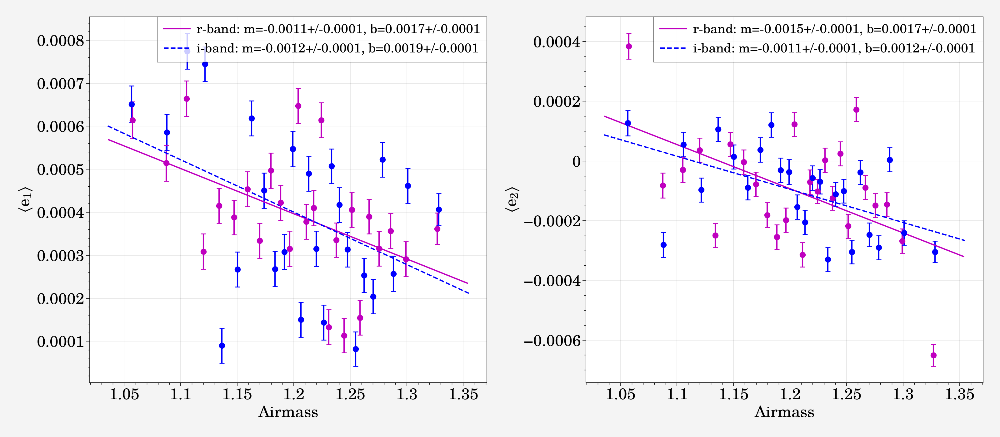

In [89]:

# r-band
mpl.rcParams.update({'font.size':18})
fig = plt.figure(figsize=(16,7))#, sharex=False, sharey=False)
ax = fig.subplots(nrows=1, ncols=2)

leg1 = r'$r$-band: m='+"{:.4f}".format(airmass_e1_r[0])+"+/-"+"{:.4f}".format(m_e1_r)+", b="+"{:.4f}".format(airmass_e1_r[2])+"+/-"+"{:.4f}".format(b_e1_r)
leg2 = r'$r$-band: m='+"{:.4f}".format(airmass_e2_r[0])+"+/-"+"{:.4f}".format(m_e2_r)+", b="+"{:.4f}".format(airmass_e2_r[2])+"+/-"+"{:.4f}".format(b_e2_r)
leg3 = r'$i$-band: m='+"{:.4f}".format(airmass_e1_i[0])+"+/-"+"{:.4f}".format(m_e1_i)+", b="+"{:.4f}".format(airmass_e1_i[2])+"+/-"+"{:.4f}".format(b_e1_i)
leg4 = r'$i$-band: m='+"{:.4f}".format(airmass_e2_i[0])+"+/-"+"{:.4f}".format(m_e2_i)+", b="+"{:.4f}".format(airmass_e2_i[2])+"+/-"+"{:.4f}".format(b_e2_i)

ax[0].errorbar(syst_map_r['mean_signal'], syst_map_r['g1'], yerr=syst_map_r['g1_cov'], fmt='o', c='m', ls='none')
ax[1].errorbar(syst_map_r['mean_signal'], syst_map_r['g2'], yerr=syst_map_r['g2_cov'], fmt='o', c='m', ls='none')

x = np.linspace(syst_map_r['mean_signal'][0]*0.98, syst_map_r['mean_signal'][-1]*1.02, 50)
l1,=ax[0].plot(x, airmass_e1_r[0]*x+airmass_e1_r[2], c='m', ls='-', label=leg1)
l2,=ax[1].plot(x, airmass_e2_r[0]*x+airmass_e2_r[2], c='m', ls='-', label=leg2)
    

# i-band
ax[0].errorbar(syst_map_i['mean_signal'], syst_map_i['g1'], yerr=syst_map_i['g1_cov'], fmt='o', c='b', ls='none')
ax[1].errorbar(syst_map_i['mean_signal'], syst_map_i['g2'], yerr=syst_map_i['g2_cov'], fmt='o', c='b', ls='none')

x = np.linspace(syst_map_i['mean_signal'][0]*0.98, syst_map_i['mean_signal'][-1]*1.02, 50)
l3,=ax[0].plot(x, airmass_e1_i[0]*x+airmass_e1_i[2], c='b', ls='--', label=leg3)
l4,=ax[1].plot(x, airmass_e2_i[0]*x+airmass_e2_i[2], c='b', ls='--', label=leg4)
    
ax[0].set_xlabel(r'Airmass')
ax[0].set_ylabel(r'$\langle e_{1} \rangle$')
ax[1].set_xlabel(r'Airmass')
ax[1].set_ylabel(r'$\langle e_{2} \rangle$')
ax[0].legend(fontsize='small')
ax[1].legend(fontsize='small')

plt.tight_layout()
# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v2/airmass_shear_ri.pdf', bbox_inches='tight')

## Exposure Time

In [11]:
syst_map_r = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/survey_sys/exposure/exposure_r_systematics.fits')
syst_map_i = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/survey_sys/exposure/exposure_i_systematics.fits')

In [12]:
sample_sigma_r = compute_error_bars_from_sims(syst_map_r, 'exposure', 'r')
sample_sigma_i = compute_error_bars_from_sims(syst_map_i, 'exposure', 'i')

100%|██████████| 25/25 [00:07<00:00,  3.32it/s]


In [13]:
exp_e1_r, exp_e2_r = fit_line(syst_map_r)

ValueError: no field of name g1_cov

In [6]:
exp_e1_i, exp_e2_i = fit_line(syst_map_i, sample_sigma_i)

                            GLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.053
Model:                            GLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     1.299
Date:                Fri, 16 Dec 2022   Prob (F-statistic):              0.266
Time:                        07:15:45   Log-Likelihood:                 185.54
No. Observations:                  25   AIC:                            -367.1
Df Residuals:                      23   BIC:                            -364.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0006      0.000      3.765      0.0

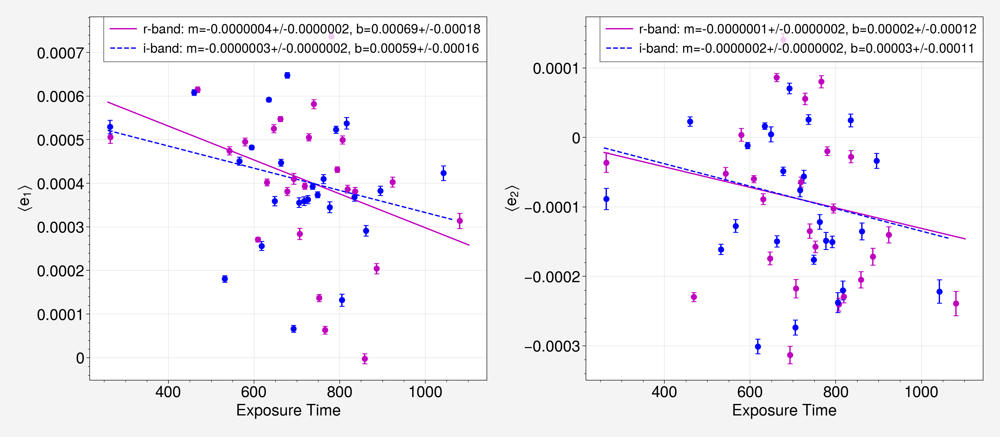

In [11]:
# r-band
mpl.rcParams.update({'font.size':18})
fig = plt.figure(figsize=(16,7))#, sharex=False, sharey=False)
ax = fig.subplots(nrows=1, ncols=2)

leg1 = r'$r$-band: m='+"{:.7f}".format(est_trained_e1_r.params[1])+"+/-"+"{:.7f}".format(est_trained_e1_r.bse[1])+", b="+"{:.5f}".format(est_trained_e1_r.params[0])+"+/-"+"{:.5f}".format(est_trained_e1_r.bse[0])
leg2 = r'$r$-band: m='+"{:.7f}".format(est_trained_e2_r.params[1])+"+/-"+"{:.7f}".format(est_trained_e2_r.bse[1])+", b="+"{:.5f}".format(est_trained_e2_r.params[0])+"+/-"+"{:.5f}".format(est_trained_e2_r.bse[0])
leg3 = r'$i$-band: m='+"{:.7f}".format(est_trained_e1_i.params[1])+"+/-"+"{:.7f}".format(est_trained_e1_i.bse[1])+", b="+"{:.5f}".format(est_trained_e1_i.params[0])+"+/-"+"{:.5f}".format(est_trained_e1_i.bse[0])
leg4 = r'$i$-band: m='+"{:.7f}".format(est_trained_e2_i.params[1])+"+/-"+"{:.7f}".format(est_trained_e2_i.bse[1])+", b="+"{:.5f}".format(est_trained_e2_i.params[0])+"+/-"+"{:.5f}".format(est_trained_e2_i.bse[0])

ax[0].errorbar(syst_map_r['mean_signal'], syst_map_r['g1'], yerr=sample_sigma_r['g1_err'], fmt='o', c='m', ls='none')
ax[1].errorbar(syst_map_r['mean_signal'], syst_map_r['g2'], yerr=sample_sigma_r['g2_err'], fmt='o', c='m', ls='none')

x = np.linspace(syst_map_r['mean_signal'][0]*0.98, syst_map_r['mean_signal'][-1]*1.02, 50)
l1,=ax[0].plot(x, est_trained_e1_r.params[1]*x+est_trained_e1_r.params[0], c='m', ls='-', label=leg1)
l2,=ax[1].plot(x, est_trained_e2_r.params[1]*x+est_trained_e2_r.params[0], c='m', ls='-', label=leg2)
    

# i-band
ax[0].errorbar(syst_map_i['mean_signal'], syst_map_i['g1'], yerr=sample_sigma_i['g1_err'], fmt='o', c='b', ls='none')
ax[1].errorbar(syst_map_i['mean_signal'], syst_map_i['g2'], yerr=sample_sigma_i['g2_err'], fmt='o', c='b', ls='none')

x = np.linspace(syst_map_i['mean_signal'][0]*0.98, syst_map_i['mean_signal'][-1]*1.02, 50)
l3,=ax[0].plot(x, est_trained_e1_i.params[1]*x+est_trained_e1_i.params[0], c='b', ls='--', label=leg3)
l4,=ax[1].plot(x, est_trained_e2_i.params[1]*x+est_trained_e2_i.params[0], c='b', ls='--', label=leg4)
    
ax[0].set_xlabel(r'Exposure Time')
ax[0].set_ylabel(r'$\langle e_{1} \rangle$')
ax[1].set_xlabel(r'Exposure Time')
ax[1].set_ylabel(r'$\langle e_{2} \rangle$')
ax[0].legend(fontsize='small')
ax[1].legend(fontsize='small')

plt.tight_layout()

## FWHM

In [ ]:
syst_map_g = fio.read('/global/cscratch1/sd/myamamot/survey_property_maps/fwhm/fwhm_g_systematics.fits')
syst_map_i = fio.read('/global/cscratch1/sd/myamamot/survey_property_maps/fwhm/fwhm_i_systematics.fits')

In [ ]:
sample_sigma_g = compute_error_bars_from_sims(syst_map_g, 'fwhm', 'g')
sample_sigma_i = compute_error_bars_from_sims(syst_map_i, 'fwhm', 'i')

In [ ]:
import statsmodels.api as sma
X = syst_map_g['mean_signal']
X2 = sma.add_constant(X)
est_e1_g = sma.GLS(syst_map_g['g1'], X2, sigma=sample_sigma_g['g1_err'])
est_trained_e1_g = est_e1_g.fit()
b_fwhm_g_e1 = est_trained_e1_g.params[1]/est_trained_e1_g.bse[1]
print(est_trained_e1_g.summary())

est_e2_g = sma.GLS(syst_map_g['g2'], X2, sigma=sample_sigma_g['g2_err'])
est_trained_e2_g = est_e2_g.fit()
b_fwhm_g_e2 = est_trained_e2_g.params[1]/est_trained_e2_g.bse[1]
print(est_trained_e2_g.summary())

In [ ]:
X = syst_map_i['mean_signal']
X2 = sma.add_constant(X)
est_e1_i = sma.GLS(syst_map_i['g1'], X2, sigma=sample_sigma_i['g1_err'])
est_trained_e1_i = est_e1_i.fit()
b_fwhm_i_e1 = est_trained_e1_i.params[1]/est_trained_e1_i.bse[1]
print(est_trained_e1_i.summary())

est_e2_i = sma.GLS(syst_map_i['g2'], X2, sigma=sample_sigma_i['g2_err'])
est_trained_e2_i = est_e2_i.fit()
b_fwhm_i_e2 = est_trained_e2_i.params[1]/est_trained_e2_i.bse[1]
print(est_trained_e2_i.summary())

In [ ]:
# g-band
mpl.rcParams.update({'font.size':20})
fig = pplt.figure(figsize=(16,7), sharex=False, sharey=False)
ax = fig.subplots(nrows=1, ncols=2)


ax[0].errorbar(syst_map_g['mean_signal'], syst_map_g['g1'], yerr=sample_sigma_g['g1_err'], fmt='o', c='m', ls='none')
ax[1].errorbar(syst_map_g['mean_signal'], syst_map_g['g2'], yerr=sample_sigma_g['g2_err'], fmt='o', c='m', ls='none')

x = np.linspace(syst_map_g['mean_signal'][0]*0.98, syst_map_g['mean_signal'][-1]*1.02, 50)
ax[0].plot(x, est_trained_e1_g.params[1]*x+est_trained_e1_g.params[0], c='m', ls='-', label=r'$g$-band')
ax[1].plot(x, est_trained_e2_g.params[1]*x+est_trained_e2_g.params[0], c='m', ls='-', label=r'$g$-band')
    

# i-band
ax[0].errorbar(syst_map_i['mean_signal'], syst_map_i['g1'], yerr=sample_sigma_i['g1_err'], fmt='o', c='b', ls='none')
ax[1].errorbar(syst_map_i['mean_signal'], syst_map_i['g2'], yerr=sample_sigma_i['g2_err'], fmt='o', c='b', ls='none')

x = np.linspace(syst_map_i['mean_signal'][0]*0.98, syst_map_i['mean_signal'][-1]*1.02, 50)
ax[0].plot(x, est_trained_e1_i.params[1]*x+est_trained_e1_i.params[0], c='b', ls='-', label=r'$i$-band')
ax[1].plot(x, est_trained_e2_i.params[1]*x+est_trained_e2_i.params[0], c='b', ls='-', label=r'$i$-band')
    
ax[0].set_xlabel(r'FWHM')
ax[0].set_ylabel(r'$\langle e_{1} \rangle$')
ax[1].set_xlabel(r'FWHM')
ax[1].set_ylabel(r'$\langle e_{2} \rangle$')
ax[0].legend(loc='upper left')

## Sky Brightness

In [ ]:
syst_map_g = fio.read('/global/cscratch1/sd/myamamot/survey_property_maps/sky/sky_g_systematics.fits')
# syst_map_i = fio.read('/global/cscratch1/sd/myamamot/survey_property_maps/sky/sky_i_systematics.fits')

In [ ]:
sample_sigma_g = compute_error_bars_from_sims(syst_map_g, 'sky', 'g')
# sample_sigma_i = compute_error_bars_from_sims(syst_map_i, 'fwhm', 'i')

In [ ]:
import statsmodels.api as sma
X = syst_map_g['mean_signal']
X2 = sma.add_constant(X)
est_e1_g = sma.GLS(syst_map_g['g1'], X2, sigma=sample_sigma_g['g1_err'])
est_trained_e1_g = est_e1_g.fit()
b_sky_g_e1 = est_trained_e1_g.params[1]/est_trained_e1_g.bse[1]
print(est_trained_e1_g.summary())

est_e2_g = sma.GLS(syst_map_g['g2'], X2, sigma=sample_sigma_g['g2_err'])
est_trained_e2_g = est_e2_g.fit()
b_sky_g_e2 = est_trained_e2_g.params[1]/est_trained_e2_g.bse[1]
print(est_trained_e2_g.summary())

In [ ]:
X = syst_map_i['mean_signal']
X2 = sma.add_constant(X)
est_e1_i = sma.GLS(syst_map_i['g1'], X2, sigma=sample_sigma_i['g1_err'])
est_trained_e1_i = est_e1_i.fit()
b_fwhm_i_e1 = est_trained_e1_i.params[1]/est_trained_e1_i.bse[1]
print(est_trained_e1_i.summary())

est_e2_i = sma.GLS(syst_map_i['g2'], X2, sigma=sample_sigma_i['g2_err'])
est_trained_e2_i = est_e2_i.fit()
b_fwhm_i_e2 = est_trained_e2_i.params[1]/est_trained_e2_i.bse[1]
print(est_trained_e2_i.summary())

In [ ]:
# g-band
mpl.rcParams.update({'font.size':20})
fig = pplt.figure(figsize=(16,7), sharex=False, sharey=False)
ax = fig.subplots(nrows=1, ncols=2)


ax[0].errorbar(syst_map_g['mean_signal'], syst_map_g['g1'], yerr=sample_sigma_g['g1_err'], fmt='o', c='m', ls='none')
ax[1].errorbar(syst_map_g['mean_signal'], syst_map_g['g2'], yerr=sample_sigma_g['g2_err'], fmt='o', c='m', ls='none')

x = np.linspace(syst_map_g['mean_signal'][0]*0.98, syst_map_g['mean_signal'][-1]*1.02, 50)
ax[0].plot(x, est_trained_e1_g.params[1]*x+est_trained_e1_g.params[0], c='m', ls='-', label=r'$g$-band')
ax[1].plot(x, est_trained_e2_g.params[1]*x+est_trained_e2_g.params[0], c='m', ls='-', label=r'$g$-band')
    

# i-band
ax[0].errorbar(syst_map_i['mean_signal'], syst_map_i['g1'], yerr=sample_sigma_i['g1_err'], fmt='o', c='b', ls='none')
ax[1].errorbar(syst_map_i['mean_signal'], syst_map_i['g2'], yerr=sample_sigma_i['g2_err'], fmt='o', c='b', ls='none')

x = np.linspace(syst_map_i['mean_signal'][0]*0.98, syst_map_i['mean_signal'][-1]*1.02, 50)
ax[0].plot(x, est_trained_e1_i.params[1]*x+est_trained_e1_i.params[0], c='b', ls='-', label=r'$i$-band')
ax[1].plot(x, est_trained_e2_i.params[1]*x+est_trained_e2_i.params[0], c='b', ls='-', label=r'$i$-band')
    
ax[0].set_xlabel(r'Sky Brightness')
ax[0].set_ylabel(r'$\langle e_{1} \rangle$')
ax[1].set_xlabel(r'Sky Brightness')
ax[1].set_ylabel(r'$\langle e_{2} \rangle$')
ax[0].legend(loc='upper left')

## stellar density & background offset

(<matplotlib.colorbar.Colorbar at 0x155503ef3ee0>, <AxesHostAxes:>)

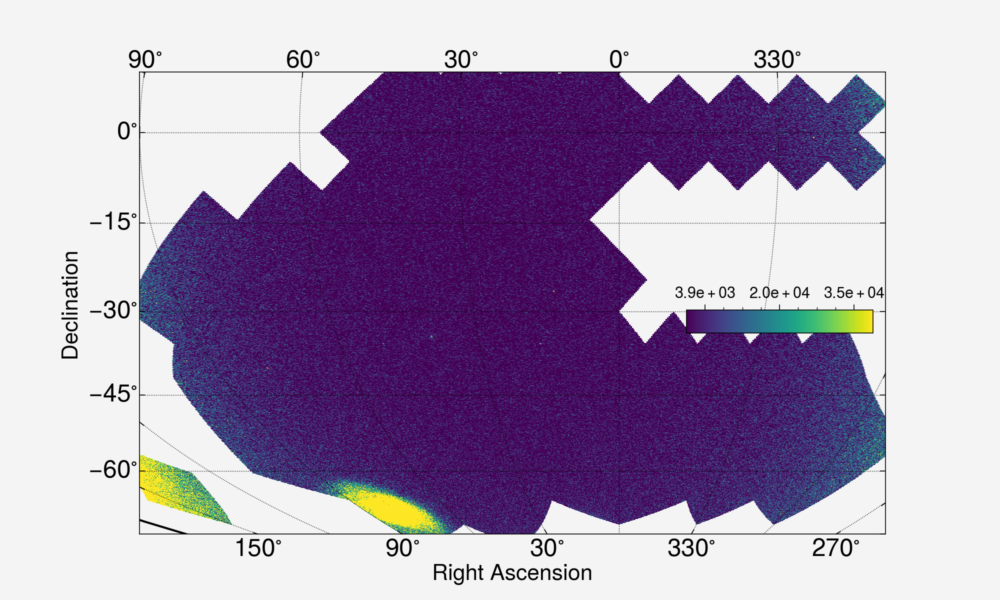

In [16]:
import healsparse
import healpy as hp
import skyproj
hmap = healsparse.HealSparseMap.read('/global/cfs/cdirs/des/myamamot/survey_property_maps/gaia_edr3_allstars_Glt19.5_desfp_density.hs')
fig,ax = plt.subplots(figsize=(10,6))
m = skyproj.DESSkyproj(ax=ax)
m.draw_des(label='DES', edgecolor='none')
_ = m.draw_hspmap(hmap, cmap='viridis')
m.draw_inset_colorbar()

(array([1.54644698e-34, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 6.10671546e-30]),
 array([-1.6375000e+30, -1.4737499e+30, -1.3100000e+30, -1.1462500e+30,
        -9.8249998e+29, -8.1875000e+29, -6.5500001e+29, -4.9124999e+29,
        -3.2750001e+29, -1.6375000e+29,  3.7578265e+06], dtype=float32),
 [<matplotlib.patches.Polygon at 0x1554fbe479d0>])

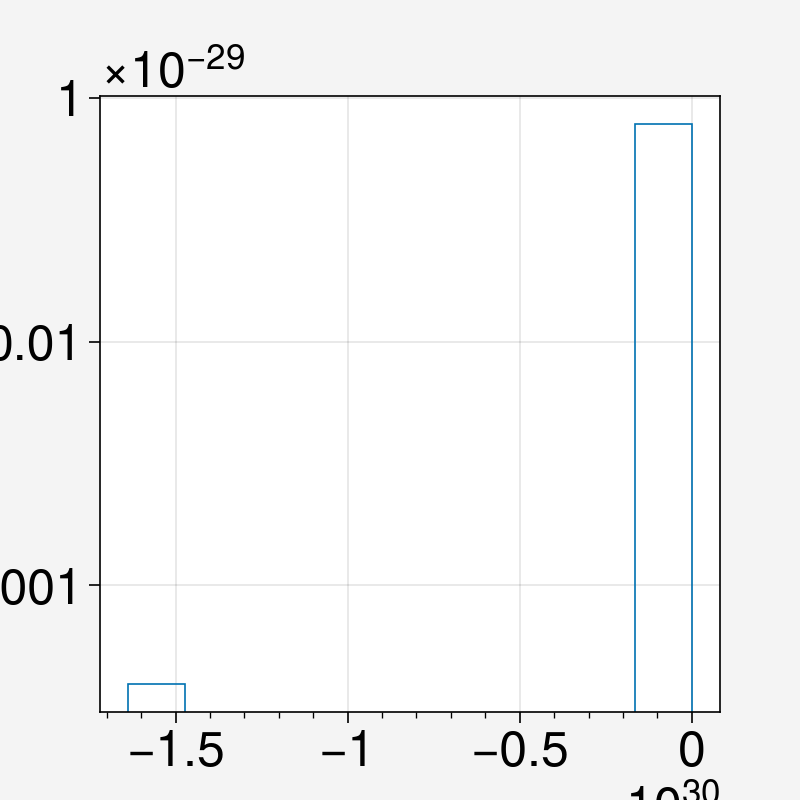

In [24]:
syst = fio.read('/global/cfs/cdirs/des/myamamot/survey_property_maps/airmass_wmean_r.fits')
hpix_ra, hpix_dec = hp.pix2ang(4096, syst['PIXEL'], nest=True, lonlat=True)
pix_signal = hmap.get_values_pos(hpix_ra, hpix_dec, lonlat=True)
fig,ax=plt.subplots()
ax.hist(pix_signal, histtype='step', log=True, density=True)

(<matplotlib.colorbar.Colorbar at 0x15550d98ab80>, <AxesHostAxes:>)

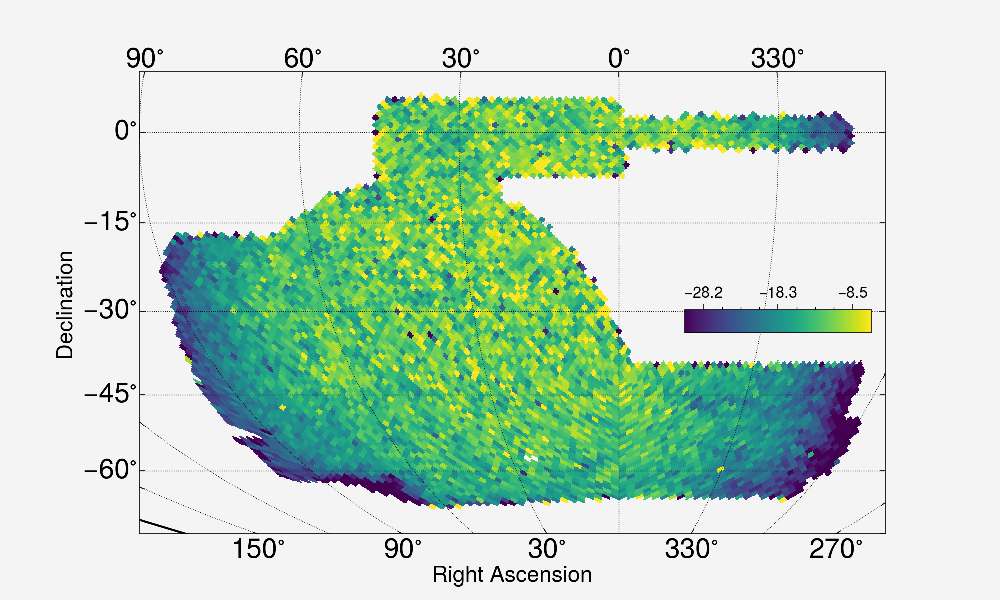

In [6]:
hmap_eps = healsparse.HealSparseMap.read('/global/cfs/cdirs/des/myamamot/survey_property_maps/epsilon_map_y6_nside64_z.hsp')
fig,ax = plt.subplots(figsize=(10,6))
m_eps = skyproj.DESSkyproj(ax=ax)
m_eps.draw_des(label='DES', edgecolor='none')
_ = m_eps.draw_hspmap(hmap_eps, cmap='viridis')
m_eps.draw_inset_colorbar()

In [25]:
syst_map_i = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/survey_sys/background/background_i_systematics.fits')

In [26]:
airmass_e1_i, airmass_e2_i = fit_line(syst_map_i)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.089
Method:                 Least Squares   F-statistic:                   0.01884
Date:                Mon, 09 Jan 2023   Prob (F-statistic):              0.893
Time:                        06:36:46   Log-Likelihood:                 92.537
No. Observations:                  13   AIC:                            -181.1
Df Residuals:                      11   BIC:                            -179.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0004      0.000      2.231      0.0

/global/homes/m/myamamot/miniforge3/envs/eastlake-dev/lib/python3.8/site-packages/statsmodels/base/model.py:127: ValueWarning: unknown kwargs ['sigma']
  warnings.warn(msg, ValueWarning)
/global/homes/m/myamamot/miniforge3/envs/eastlake-dev/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=13
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/global/homes/m/myamamot/miniforge3/envs/eastlake-dev/lib/python3.8/site-packages/statsmodels/base/model.py:127: ValueWarning: unknown kwargs ['sigma']
  warnings.warn(msg, ValueWarning)
/global/homes/m/myamamot/miniforge3/envs/eastlake-dev/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=13
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


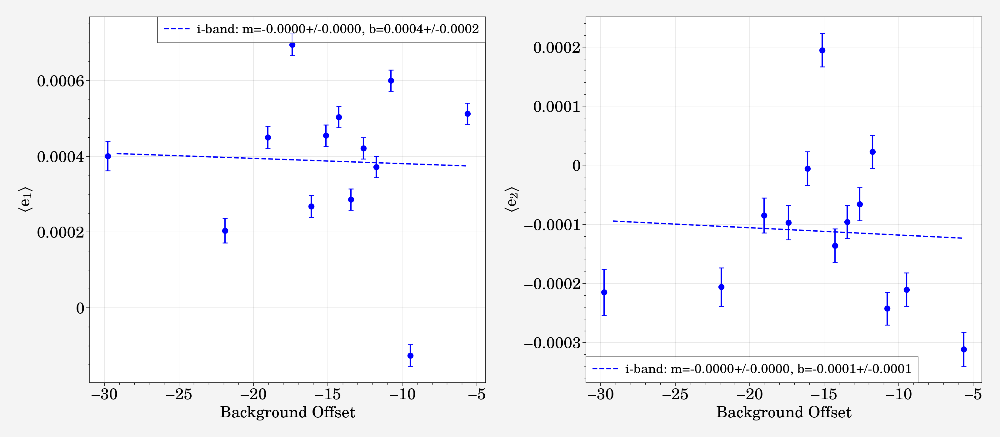

In [27]:

# r-band
mpl.rcParams.update({'font.size':18})
fig = plt.figure(figsize=(16,7))#, sharex=False, sharey=False)
ax = fig.subplots(nrows=1, ncols=2)

# leg1 = r'$r$-band: m='+"{:.4f}".format(airmass_e1_r[0])+"+/-"+"{:.4f}".format(airmass_e1_r[1])+", b="+"{:.4f}".format(airmass_e1_r[2])+"+/-"+"{:.4f}".format(airmass_e1_r[3])
# leg2 = r'$r$-band: m='+"{:.4f}".format(airmass_e2_r[0])+"+/-"+"{:.4f}".format(airmass_e2_r[1])+", b="+"{:.4f}".format(airmass_e2_r[2])+"+/-"+"{:.4f}".format(airmass_e2_r[3])
leg3 = r'$i$-band: m='+"{:.4f}".format(airmass_e1_i[0])+"+/-"+"{:.4f}".format(airmass_e1_i[1])+", b="+"{:.4f}".format(airmass_e1_i[2])+"+/-"+"{:.4f}".format(airmass_e1_i[3])
leg4 = r'$i$-band: m='+"{:.4f}".format(airmass_e2_i[0])+"+/-"+"{:.4f}".format(airmass_e2_i[1])+", b="+"{:.4f}".format(airmass_e2_i[2])+"+/-"+"{:.4f}".format(airmass_e2_i[3])

# ax[0].errorbar(syst_map_r['mean_signal'], syst_map_r['g1'], yerr=syst_map_r['g1_cov'], fmt='o', c='m', ls='none')
# ax[1].errorbar(syst_map_r['mean_signal'], syst_map_r['g2'], yerr=syst_map_r['g2_cov'], fmt='o', c='m', ls='none')

# x = np.linspace(syst_map_r['mean_signal'][0]*0.98, syst_map_r['mean_signal'][-1]*1.02, 50)
# l1,=ax[0].plot(x, airmass_e1_r[0]*x+airmass_e1_r[2], c='m', ls='-', label=leg1)
# l2,=ax[1].plot(x, airmass_e2_r[0]*x+airmass_e2_r[2], c='m', ls='-', label=leg2)
    

# i-band
ax[0].errorbar(syst_map_i['mean_signal'], syst_map_i['g1'], yerr=syst_map_i['g1_cov'], fmt='o', c='b', ls='none')
ax[1].errorbar(syst_map_i['mean_signal'], syst_map_i['g2'], yerr=syst_map_i['g2_cov'], fmt='o', c='b', ls='none')

x = np.linspace(syst_map_i['mean_signal'][0]*0.98, syst_map_i['mean_signal'][-1]*1.02, 50)
l3,=ax[0].plot(x, airmass_e1_i[0]*x+airmass_e1_i[2], c='b', ls='--', label=leg3)
l4,=ax[1].plot(x, airmass_e2_i[0]*x+airmass_e2_i[2], c='b', ls='--', label=leg4)
    
ax[0].set_xlabel(r'Background Offset')
ax[0].set_ylabel(r'$\langle e_{1} \rangle$')
ax[1].set_xlabel(r'Background Offset')
ax[1].set_ylabel(r'$\langle e_{2} \rangle$')
ax[0].legend(fontsize='small')
ax[1].legend(fontsize='small')

plt.tight_layout()
# plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/final_v2/airmass_shear_ri.pdf', bbox_inches='tight')

## Summary

In [ ]:
# slope/slope_err

print('Airmass g-band b/b_err', b_airmass_g_e1, b_airmass_g_e2)
print('Airmass i-band b/b_err', b_airmass_i_e1, b_airmass_i_e2)
print('FWHM g-band b/b_err', b_fwhm_g_e1, b_fwhm_g_e2)
print('FWHM i-band b/b_err', b_fwhm_i_e1, b_fwhm_i_e2)
print('Sky Brightness g-band b/b_err', b_fwhm_g_e1, b_fwhm_g_e2)